### Building a environment to install necessary libraries by Anaconda is recommended.

In [ ]:
# conda install -c conda-forge geoparse
# conda install -c anaconda scikit-learn
# conda install -c anaconda statsmodels
# conda install -c anaconda pandas
# conda install -c anaconda numpy
# conda install -c anaconda requests
# conda install -c conda-forge hdbscan
# conda install -c conda-forge tensorflow

### Importing necessary libraries

In [28]:
#Importing a series of libraries used throughout the pipeline
import GEOparse
import pandas as pd
import numpy as np
import os
import json
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import quantile_transform
from sklearn.decomposition import PCA
import requests
# os.chdir('../Data')
# os.chdir('../Scripts')
# from microarray_analysis import *

### Download data from NCBI GEO based on the GEO accession ID

In [ ]:
#The series accession id for the study you are analyzing
geo_accession_id = "GSE40279"

In [ ]:
#Parse the GEO data using the Accession ID
gse = GEOparse.get_GEO(geo=geo_accession_id, destdir="./")

In [ ]:
import GEOparse

In [ ]:
#Parse the GEO data using the Accession ID
gse30870 = GEOparse.get_GEO(geo="GSE30870", destdir="./")

In [ ]:
#Parse the GEO data using the Accession ID
gse50660 = GEOparse.get_GEO(geo="GSE50660", destdir="./")

In [ ]:
#Parse the GEO data using the Accession ID
gse56105 = GEOparse.get_GEO(geo="GSE56105", destdir="./")

### Save the downloaded data by pickle

In [ ]:
import pickle
# Save the gse object to a local file
with open('gse_data.pickle', 'wb') as file:
    pickle.dump(gse, file)

In [ ]:
import pickle
# Save the gse object to a local file
with open('gse30870_data.pickle', 'wb') as file:
    pickle.dump(gse30870, file)

In [ ]:
import pickle
# Save the gse object to a local file
with open('gse50660_data.pickle', 'wb') as file:
    pickle.dump(gse50660, file)

In [ ]:
import pickle
# Save the gse object to a local file
with open('gse56105_data.pickle', 'wb') as file:
    pickle.dump(gse56105, file)

### Load the data from saved data by pickle next time

In [29]:
import pickle
# Load the gse object from the local file
with open('gse_data.pickle', 'rb') as file:
    gse = pickle.load(file)

In [30]:
import pickle
# Load the gse object from the local file
with open('gse30870_data.pickle', 'rb') as file:
    gse30870 = pickle.load(file)

In [ ]:
import pickle
# Load the gse object from the local file
with open('gse50660_data.pickle', 'rb') as file:
    gse50660 = pickle.load(file)

In [ ]:
import pickle
# Load the gse object from the local file
with open('gse56105_data.pickle', 'rb') as file:
    gse56105 = pickle.load(file)

### Extract expression value (beta value) for each probes corresponding to each samples

In [ ]:
#Visualization of expression matrix
pivoted_samples_40279 = gse.pivot_samples('VALUE')
pivoted_samples_40279.head()

In [ ]:
type(pivoted_samples_40279)

In [ ]:
#Visualization of expression matrix
pivoted_samples_30870 = gse30870.pivot_samples('VALUE')
pivoted_samples_30870.head()

In [ ]:
#Visualization of expression matrix
pivoted_samples_50660 = gse50660.pivot_samples('VALUE')
pivoted_samples_50660.head()

In [ ]:
#Visualization of expression matrix
pivoted_samples_56105 = gse56105.pivot_samples('VALUE')
pivoted_samples_56105.head()

#### Save pivoted_samples by pickle

In [ ]:
# Save the pivoted_samples
import pickle
with open('pivoted_data_40279.pickle', 'wb') as file:
    pickle.dump(pivoted_samples_40279, file)

In [ ]:
# Save the pivoted_samples
import pickle
with open('pivoted_data_30870.pickle', 'wb') as file:
    pickle.dump(pivoted_samples_30870, file)

In [ ]:
# Save the pivoted_samples
import pickle
with open('pivoted_data_50660.pickle', 'wb') as file:
    pickle.dump(pivoted_samples_50660, file)

#### Load pivoted_samples by pickle

In [31]:
import pickle
# Load the pivoted_data_40279 object from the local file
with open('pivoted_data_40279.pickle', 'rb') as file:
    pivoted_samples_40279 = pickle.load(file)

In [32]:
import pickle
# Load the pivoted_data_30870 object from the local file
with open('pivoted_data_30870.pickle', 'rb') as file:
    pivoted_samples_30870 = pickle.load(file)

In [ ]:
import pickle
# Load the pivoted_data_50660 object from the local file
with open('pivoted_data_50660.pickle', 'rb') as file:
    pivoted_samples_50660 = pickle.load(file)

In [ ]:
pivoted_samples_40279.head()

In [ ]:
type(pivoted_samples_40279)

In [ ]:
pivoted_samples_30870.head()

In [ ]:
pivoted_samples_30870

In [ ]:
pivoted_samples_50660

#### Check information of this data

In [ ]:
#Determine the total amount of probes used in the study
pivoted_samples_average = pivoted_samples.median(axis=1)
print("Number of probes before filtering: ", len(pivoted_samples_average))

In [ ]:
print(type(pivoted_samples))
print()
print(pivoted_samples.median(axis=0))
print()
print(pivoted_samples.median(axis=1))

In [ ]:
pivoted_samples.min(axis=1)

In [ ]:
pivoted_samples.max(axis=1)

In [ ]:
metadata = gse.metadata
print(metadata)
print(metadata.keys())

In [ ]:
metadata_items = metadata.items()
keys = list(metadata.keys())
values = list(metadata.values())

metadata_df = pd.DataFrame(keys, values)
print(metadata_df)

##### phenotype_data

In [33]:
phenotype_data_40279 = gse.phenotype_data
print(phenotype_data_40279.head())

                  title geo_accession                 status submission_date  \
GSM989827  age 67y 1001     GSM989827  Public on Nov 21 2012     Aug 21 2012   
GSM989828  age 89y 1002     GSM989828  Public on Nov 21 2012     Aug 21 2012   
GSM989829  age 66y 1003     GSM989829  Public on Nov 21 2012     Aug 21 2012   
GSM989830  age 64y 1004     GSM989830  Public on Nov 21 2012     Aug 21 2012   
GSM989831  age 62y 1005     GSM989831  Public on Nov 21 2012     Aug 21 2012   

          last_update_date     type channel_count source_name_ch1  \
GSM989827      Nov 21 2012  genomic             1           X1001   
GSM989828      Nov 21 2012  genomic             1           X1002   
GSM989829      Nov 21 2012  genomic             1           X1003   
GSM989830      Nov 21 2012  genomic             1           X1004   
GSM989831      Nov 21 2012  genomic             1           X1005   

           organism_ch1 taxid_ch1  ...                contact_email  \
GSM989827  Homo sapiens      9606

In [ ]:
print(phenotype_data_40279.columns)

In [34]:
# Assuming 'phenotype_data' is the DataFrame with sample information
# Extract the 'title' and 'characteristics_ch1.0.age (y)' columns
sample_age_gender_data_40279 = phenotype_data_40279[['characteristics_ch1.0.age (y)', 'characteristics_ch1.3.gender']]

# Rename the columns for clarity
sample_age_gender_data_40279.columns = ['Age', 'Gender']

# Convert the 'Age' columns to numeric values
sample_age_gender_data_40279['Age'] = pd.to_numeric(sample_age_gender_data_40279['Age'], errors='coerce')

# Display the new DataFrame
print(sample_age_gender_data_40279)


           Age Gender
GSM989827   67      F
GSM989828   89      F
GSM989829   66      F
GSM989830   64      F
GSM989831   62      F
...        ...    ...
GSM990623   78      F
GSM990624   71      M
GSM990625   68      M
GSM990626   61      F
GSM990627   73      M

[656 rows x 2 columns]


C:\Users\tokyo\AppData\Local\Temp\ipykernel_18460\3604874324.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_age_gender_data_40279['Age'] = pd.to_numeric(sample_age_gender_data_40279['Age'], errors='coerce')


In [ ]:
type(sample_age_gender_data_40279)

In [35]:
phenotype_data_30870 = gse30870.phenotype_data
print(phenotype_data_30870.head())

                 title geo_accession                 status submission_date  \
GSM765860      CDH+103     GSM765860  Public on Jun 13 2012     Jul 22 2011   
GSM765861  CDH+NewBorn     GSM765861  Public on Jun 13 2012     Jul 22 2011   
GSM765862        OLD16     GSM765862  Public on Jun 13 2012     Jul 22 2011   
GSM765863        OLD17     GSM765863  Public on Jun 13 2012     Jul 22 2011   
GSM765864        OLD18     GSM765864  Public on Jun 13 2012     Jul 22 2011   

          last_update_date     type channel_count source_name_ch1  \
GSM765860      Jun 13 2012  genomic             1   Nonagenarians   
GSM765861      Jun 13 2012  genomic             1        Newborns   
GSM765862      Jun 13 2012  genomic             1   Nonagenarians   
GSM765863      Jun 13 2012  genomic             1   Nonagenarians   
GSM765864      Jun 13 2012  genomic             1   Nonagenarians   

           organism_ch1 taxid_ch1  ... contact_department contact_institute  \
GSM765860  Homo sapiens      96

In [ ]:
print(phenotype_data_30870.columns)

In [36]:
# Assuming 'phenotype_data' is the DataFrame with sample information
# Extract the 'title' and 'characteristics_ch1.0.age (y)' columns
sample_age_data_30870 = pd.DataFrame(phenotype_data_30870['characteristics_ch1.0.age'])

# Rename the columns for clarity
sample_age_data_30870.columns = ['Age']

# Display the new DataFrame
print(sample_age_data_30870)

                 Age
GSM765860  103 years
GSM765861    Newborn
GSM765862   97 years
GSM765863   95 years
GSM765864   97 years
GSM765865   97 years
GSM765866   98 years
GSM765867   96 years
GSM765868  100 years
GSM765869   90 years
GSM765870   91 years
GSM765871   92 years
GSM765872   89 years
GSM765873   90 years
GSM765874   89 years
GSM765875   90 years
GSM765876   91 years
GSM765877   89 years
GSM765878   89 years
GSM765879   90 years
GSM765880   90 years
GSM765881    Newborn
GSM765882    Newborn
GSM765883    Newborn
GSM765884    Newborn
GSM765885    Newborn
GSM765886    Newborn
GSM765887    Newborn
GSM765888    Newborn
GSM765889    Newborn
GSM765890    Newborn
GSM765891    Newborn
GSM765892    Newborn
GSM765893    Newborn
GSM765894    Newborn
GSM765895    Newborn
GSM765896    Newborn
GSM765897    Newborn
GSM765898    Newborn
GSM765899    Newborn


In [37]:
sample_age_data_30870['Age'] = sample_age_data_30870['Age'].str.replace(' years', '').replace('Newborn', '0')
sample_age_data_30870

,Age
GSM765860,103
GSM765861,0
GSM765862,97
GSM765863,95
GSM765864,97
GSM765865,97
GSM765866,98
GSM765867,96
GSM765868,100
GSM765869,90


In [ ]:
sample_age_data_30870['Age'] = pd.to_numeric(sample_age_data_30870['Age'])

In [ ]:
type(sample_age_data_30870['Age'])

In [ ]:
phenotype_data_50660 = gse50660.phenotype_data
print(phenotype_data_50660.head())

In [ ]:
phenotype_data_50660.columns

In [ ]:
# Assuming 'phenotype_data' is the DataFrame with sample information
# Extract the 'title' and 'characteristics_ch1.0.age (y)' columns
sample_age_data_50660 = pd.DataFrame(phenotype_data_50660['characteristics_ch1.1.age'])

# Rename the columns for clarity
sample_age_data_50660.columns = ['Age']

# Display the new DataFrame
print(sample_age_data_50660)

In [ ]:
'characteristics_ch1.1.age', 'characteristics_ch1.2.gender'

##### Age of Combined samples

In [ ]:
sample_age_gender_data_40279['Age']

In [ ]:
sample_age_data_30870['Age']

In [ ]:
import pandas as pd

# Assuming sample_age_gender_data_40279 and sample_age_data_30870 are your dataframes

# Combine the 'Age' columns from both dataframes into a single column
combined_age_data = pd.concat([sample_age_gender_data_40279['Age'], sample_age_data_50660['Age']], axis=0, ignore_index=False)
combined_age_data = pd.DataFrame(combined_age_data)

# Now combined_age_data contains the 'Age' values from both dataframes in a single column
print(combined_age_data)


In [ ]:
# Convert the 'Age' columns to numeric values
sample_age_gender_data_40279['Age'] = pd.to_numeric(sample_age_gender_data_40279['Age'], errors='coerce')
sample_age_data_30870['Age'] = pd.to_numeric(sample_age_data_30870['Age'], errors='coerce')

# Check for missing values
print("Missing values in sample_age_gender_data_40279:", sample_age_gender_data_40279['Age'].isnull().sum())
print("Missing values in sample_age_data_30870:", sample_age_data_30870['Age'].isnull().sum())

# Try combining the data again
combined_samples_data_age = sample_age_gender_data_40279['Age'] + sample_age_data_30870['Age']


In [ ]:
# Convert the 'Age' columns to numeric values
sample_age_gender_data_40279.loc[:, 'Age'] = pd.to_numeric(sample_age_gender_data_40279['Age'], errors='coerce')
sample_age_data_30870.loc[:, 'Age'] = pd.to_numeric(sample_age_data_30870['Age'], errors='coerce')

# Check for missing values
print("Missing values in sample_age_gender_data_40279:", sample_age_gender_data_40279['Age'].isnull().sum())
print("Missing values in sample_age_data_30870:", sample_age_data_30870['Age'].isnull().sum())

# Try combining the data again
combined_samples_data_age = sample_age_gender_data_40279['Age'] + sample_age_data_30870['Age']


In [ ]:
combined_age_data

#### Combine pivoted samples

In [ ]:
pivoted_samples_40279.index

In [ ]:
pivoted_samples_30870.index

In [ ]:
pivoted_samples_50660.index

In [ ]:
# Combine the 'Age' columns from both dataframes into a single column
pivoted_samples = pd.concat([pivoted_samples_50660, pivoted_samples_40279], axis=1, join='inner', ignore_index=False)
pivoted_samples = pd.DataFrame(pivoted_samples)

In [ ]:
pivoted_samples

##### Save combined pivoted_samples

In [ ]:
# Save the pivoted_samples
import pickle
with open('pivoted_data.pickle', 'wb') as file:
    pickle.dump(pivoted_samples, file)

##### Load saved pivoted_samples

In [ ]:
import pickle
# Load the pivoted_data object from the local file
with open('pivoted_data.pickle', 'rb') as file:
    pivoted_samples = pickle.load(file)

In [ ]:
pivoted_samples.columns

In [ ]:
print(pivoted_samples.index)
len(pivoted_samples.index)

In [ ]:
pivoted_samples.GSM1225377

### Results from multiple linear regression model 

In [ ]:
import pickle
# Load the results_df object from the local file
with open('results_df.pickle', 'rb') as file:
    results_df = pickle.load(file)

#### Adjust p.values by BH method for multiple testing

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests

In [ ]:
# Apply the Benjamini-Hochberg correction
results_df['Adjusted_p-value_Age'] = multipletests(results_df['p-value_Age'], method='fdr_bh')[1]
results_df['Adjusted_p-value_Gender'] = multipletests(results_df['p-value_Gender'], method='fdr_bh')[1]

In [ ]:
print(results_df.head())

In [ ]:
# Sort the results_df DataFrame by 'R-squared' column in descending order
results_df = results_df.sort_values(by='R-squared', ascending=False)

# Print the sorted results DataFrame
print(results_df.head())

#### Save the results after performing regression and p.value adjusting 

In [ ]:
import pickle
# Save the results_df object to a local file
with open('results_df.pickle', 'wb') as file:
    pickle.dump(results_df, file)

#### Load the results_df

In [38]:
import pickle
with open('results_df.pickle', 'rb') as file:
    results_df = pickle.load(file)

In [ ]:
print(results_df.head())

### Filter age-related probes

#### Probes with R-squared > 0.7

In [39]:
# Filter the probes with R-squared > 0.7
results_df_07 = results_df[results_df['R-squared'] > 0.7]

# Print the filtered DataFrame
print(results_df_07.head())

          Probe_ID  coef_Intercept  coef_Age  p-value_Age  coef_Gender  \
87051   cg04462931        0.451527  0.000204     0.026797     0.400134   
217983  cg11955727        0.582826  0.000169     0.022359     0.261685   
315555  cg17765025        0.568103 -0.000058     0.473091     0.229386   
8226    cg00399683        0.583450  0.000115     0.195509     0.240899   
233448  cg12949927        0.617390  0.000183     0.037384     0.232580   

        p-value_Gender  R-squared  Adjusted_p-value_Age  \
87051              0.0   0.970963              0.062213   
217983             0.0   0.957005              0.053590   
315555             0.0   0.935353              0.594971   
8226               0.0   0.928524              0.305902   
233448             0.0   0.925232              0.081718   

        Adjusted_p-value_Gender  
87051                       0.0  
217983                      0.0  
315555                      0.0  
8226                        0.0  
233448                      0.

In [14]:
# Amount of the probes in results_df_07
num_probes_in_df_07 = results_df_07.shape[0]  # Access the number of rows using shape
print("Number of probes in results_df_0.7:", num_probes_in_df_07)

Number of probes in results_df_0.7: 53


#### Filter the expression values (beta values) based on the probe with R-squared > 0.7

In [40]:
# Get the list of 'Probe_ID' values from results_df_07
filtered_probe_ids_07 = results_df_07['Probe_ID'].tolist()

# Filter the rows in pivoted_samples using the 'Probe_ID' values
pivoted_samples_07 = pivoted_samples_40279[pivoted_samples_40279.index.isin(filtered_probe_ids_07)]

# Print the filtered expression values
print(pivoted_samples_07.head())

name        GSM989827  GSM989828  GSM989829  GSM989830  GSM989831  GSM989832  \
ID_REF                                                                         
cg00167275   0.339794   0.308087   0.384180   0.381271   0.329035   0.370114   
cg00399683   0.837955   0.811371   0.809503   0.823190   0.800675   0.822112   
cg00500229   0.137794   0.150368   0.136496   0.119805   0.123281   0.157386   
cg00774458   0.792943   0.801659   0.765358   0.778534   0.791380   0.766673   
cg00804338   0.296725   0.278522   0.327339   0.255138   0.252064   0.293368   

name        GSM989833  GSM989834  GSM989835  GSM989836  ...  GSM990618  \
ID_REF                                                  ...              
cg00167275   0.061615   0.339474   0.370807   0.375922  ...   0.336506   
cg00399683   0.567726   0.821688   0.824752   0.778578  ...   0.845356   
cg00500229   0.250605   0.139630   0.160768   0.166296  ...   0.161149   
cg00774458   0.630556   0.791275   0.769961   0.781188  ...   0.79669

In [ ]:
num_rows_in_pivoted_samples_07 = pivoted_samples_07.shape[0]
print("Number of rows in pivoted_samples_07:", num_rows_in_pivoted_samples_07)

#### Probes with R-squared > 0.5

In [41]:
# Filter the probes with R-squared > 0.5
results_df_05 = results_df[results_df['R-squared'] > 0.5]

# Print the filtered DataFrame
print(results_df_05.head())

          Probe_ID  coef_Intercept  coef_Age  p-value_Age  coef_Gender  \
87051   cg04462931        0.451527  0.000204     0.026797     0.400134   
217983  cg11955727        0.582826  0.000169     0.022359     0.261685   
315555  cg17765025        0.568103 -0.000058     0.473091     0.229386   
8226    cg00399683        0.583450  0.000115     0.195509     0.240899   
233448  cg12949927        0.617390  0.000183     0.037384     0.232580   

        p-value_Gender  R-squared  Adjusted_p-value_Age  \
87051              0.0   0.970963              0.062213   
217983             0.0   0.957005              0.053590   
315555             0.0   0.935353              0.594971   
8226               0.0   0.928524              0.305902   
233448             0.0   0.925232              0.081718   

        Adjusted_p-value_Gender  
87051                       0.0  
217983                      0.0  
315555                      0.0  
8226                        0.0  
233448                      0.

In [ ]:
# Amount of the probes in results_df_05
num_probes_in_df_05 = results_df_05.shape[0]  # Access the number of rows using shape
print("Number of probes in results_df_0.5:", num_probes_in_df_05)

#### Filter the expression values (beta values) based on the probe with R-squared > 0.5

In [42]:
# Get the list of 'Probe_ID' values from results_df_5
filtered_probe_ids_05 = results_df_05['Probe_ID'].tolist()

# Filter the rows in pivoted_samples using the 'Probe_ID' values
pivoted_samples_05 = pivoted_samples_40279[pivoted_samples_40279.index.isin(filtered_probe_ids_05)]

# Print the filtered expression values
print(pivoted_samples_05.head())

name        GSM989827  GSM989828  GSM989829  GSM989830  GSM989831  GSM989832  \
ID_REF                                                                         
cg00167275   0.339794   0.308087   0.384180   0.381271   0.329035   0.370114   
cg00351283   0.641760   0.654487   0.624891   0.627309   0.609425   0.662757   
cg00399683   0.837955   0.811371   0.809503   0.823190   0.800675   0.822112   
cg00500229   0.137794   0.150368   0.136496   0.119805   0.123281   0.157386   
cg00739353   0.850796   0.889854   0.886508   0.856968   0.879049   0.900876   

name        GSM989833  GSM989834  GSM989835  GSM989836  ...  GSM990618  \
ID_REF                                                  ...              
cg00167275   0.061615   0.339474   0.370807   0.375922  ...   0.336506   
cg00351283   0.706329   0.617947   0.623201   0.619334  ...   0.661313   
cg00399683   0.567726   0.821688   0.824752   0.778578  ...   0.845356   
cg00500229   0.250605   0.139630   0.160768   0.166296  ...   0.16114

##### Check expression value for a specific CpG site

In [ ]:
# Check beta value for a specific probe
pivoted_samples.loc['cg10501210'].values

### Filter probes relate to age-related probes

#### Filter expression values

### Predict age on other dataset

####  by 53 age-related model using LR.

In [18]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_07.T

# Load the age values for the dataset
#y = combined_age_data['Age']
y = sample_age_gender_data_40279['Age']

# Split the data into training and testing sets (you can adjust the test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Calculate evaluation metrics (e.g., Mean Squared Error and R-squared)
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

Mean Squared Error: 82.28538914163563
R-squared: 0.6453738840108743


In [19]:
# Get the list of 'Probe_ID' values from results_df_07
#filtered_probe_ids_07 = results_df_07['Probe_ID'].tolist()

# Filter the rows in pivoted_samples using the 'Probe_ID' values
#pivoted_samples_07 = pivoted_samples[pivoted_samples.index.isin(filtered_probe_ids_07)]

# Now you can use the trained model to predict age for new data
new_data_to_predict = pivoted_samples_30870
X_new_data_to_predict = new_data_to_predict[new_data_to_predict.index.isin(filtered_probe_ids_07)].T
print(X_new_data_to_predict)

ID_REF     cg00167275  cg00399683  cg00500229  cg00774458  cg00804338  \
name                                                                    
GSM765860    0.064670    0.612996    0.431196    0.630378    0.050361   
GSM765861    0.030757    0.696062    0.275024    0.683184    0.032541   
GSM765862    0.326615    0.805149    0.152980    0.812822    0.271788   
GSM765863    0.363115    0.819858    0.138455    0.830171    0.287900   
GSM765864    0.291458    0.852226    0.153179    0.809179    0.332746   
GSM765865    0.066853    0.725100    0.233710    0.714946    0.242626   
GSM765866    0.382497    0.867149    0.151728    0.856242    0.261537   
GSM765867    0.378826    0.888188    0.169993    0.901945    0.273652   
GSM765868    0.107250    0.561516    0.347267    0.631007    0.084587   
GSM765869    0.355936    0.823331    0.229820    0.781816    0.286212   
GSM765870    0.310161    0.846230    0.183523    0.831232    0.296096   
GSM765871    0.343867    0.860226    0.190548    0.

In [20]:
from sklearn.impute import SimpleImputer

# Impute missing values (NaN) with mean values for Expression
imputer = SimpleImputer(strategy='mean')
X_new_data_to_predict = imputer.fit_transform(X_new_data_to_predict)
predicted_age = model.predict(X_new_data_to_predict)
print(predicted_age)

[ 77.40732386 -22.61074486  75.02465711  74.6531991   82.98700515
  91.83395895  78.3114189   80.44403381  74.2033714   70.17896235
  73.46140065  72.59213666  80.96184464  80.59290631 100.44724724
  77.07939098  78.9667787   82.90179019  86.19081774  95.38231743
  79.87508164 -15.7689885  -17.50272501 -20.16759755 -10.28749106
 -16.67940925   1.22354145 -19.85720768 -18.33193122   6.61997542
  -4.13161802  -8.53046755  -7.87778739 -11.53253063 -16.3453718
  -5.98208151 -20.499198   -24.19686556  -9.09368746  -5.96395079]


c:\Users\tokyo\anaconda3\envs\tensorflow_use\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [21]:
Chronological_age_30870 = gse30870.phenotype_data['characteristics_ch1.0.age']
print(Chronological_age_30870)

GSM765860    103 years
GSM765861      Newborn
GSM765862     97 years
GSM765863     95 years
GSM765864     97 years
GSM765865     97 years
GSM765866     98 years
GSM765867     96 years
GSM765868    100 years
GSM765869     90 years
GSM765870     91 years
GSM765871     92 years
GSM765872     89 years
GSM765873     90 years
GSM765874     89 years
GSM765875     90 years
GSM765876     91 years
GSM765877     89 years
GSM765878     89 years
GSM765879     90 years
GSM765880     90 years
GSM765881      Newborn
GSM765882      Newborn
GSM765883      Newborn
GSM765884      Newborn
GSM765885      Newborn
GSM765886      Newborn
GSM765887      Newborn
GSM765888      Newborn
GSM765889      Newborn
GSM765890      Newborn
GSM765891      Newborn
GSM765892      Newborn
GSM765893      Newborn
GSM765894      Newborn
GSM765895      Newborn
GSM765896      Newborn
GSM765897      Newborn
GSM765898      Newborn
GSM765899      Newborn
Name: characteristics_ch1.0.age, dtype: object


In [22]:
import pandas as pd
import numpy as np  # Make sure you have numpy imported

data = {
    'Predicted age': predicted_age,
    'Chronological age': Chronological_age_30870
}

predicted_30870 = pd.DataFrame(data)
print(predicted_30870)

           Predicted age Chronological age
GSM765860      77.407324         103 years
GSM765861     -22.610745           Newborn
GSM765862      75.024657          97 years
GSM765863      74.653199          95 years
GSM765864      82.987005          97 years
GSM765865      91.833959          97 years
GSM765866      78.311419          98 years
GSM765867      80.444034          96 years
GSM765868      74.203371         100 years
GSM765869      70.178962          90 years
GSM765870      73.461401          91 years
GSM765871      72.592137          92 years
GSM765872      80.961845          89 years
GSM765873      80.592906          90 years
GSM765874     100.447247          89 years
GSM765875      77.079391          90 years
GSM765876      78.966779          91 years
GSM765877      82.901790          89 years
GSM765878      86.190818          89 years
GSM765879      95.382317          90 years
GSM765880      79.875082          90 years
GSM765881     -15.768989           Newborn
GSM765882  

In [23]:
# Remove ' years' from Chronological age and replace 'Newborn' with 1
predicted_30870['Chronological age'] = predicted_30870['Chronological age'].str.replace(' years', '').replace('Newborn', '0')

# Convert the Chronological age column to numeric
predicted_30870['Chronological age'] = pd.to_numeric(predicted_30870['Chronological age'])

# Print the updated DataFrame
print(predicted_30870)

           Predicted age  Chronological age
GSM765860      77.407324                103
GSM765861     -22.610745                  0
GSM765862      75.024657                 97
GSM765863      74.653199                 95
GSM765864      82.987005                 97
GSM765865      91.833959                 97
GSM765866      78.311419                 98
GSM765867      80.444034                 96
GSM765868      74.203371                100
GSM765869      70.178962                 90
GSM765870      73.461401                 91
GSM765871      72.592137                 92
GSM765872      80.961845                 89
GSM765873      80.592906                 90
GSM765874     100.447247                 89
GSM765875      77.079391                 90
GSM765876      78.966779                 91
GSM765877      82.901790                 89
GSM765878      86.190818                 89
GSM765879      95.382317                 90
GSM765880      79.875082                 90
GSM765881     -15.768989        

In [24]:
# Calculate evaluation metrics (e.g., Mean Squared Error and R-squared)
Chronological = predicted_30870['Chronological age']
Predicted = predicted_30870['Predicted age']

mse = mean_squared_error(Chronological, Predicted)
r_squared = r2_score(Chronological, Predicted)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

Mean Squared Error: 231.60403754104263
R-squared: 0.8936642245679487


In [ ]:
print(predicted_30870.shape)

In [ ]:
print(gse30870.phenotype_data.columns)

In [ ]:
print(pivoted_samples_07.head())

#### by 53(age-related)+ 46(relate age-realted) model using LR.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_07.T

# Load the age values for the dataset
#y = combined_age_data['Age']
y = sample_age_gender_data_40279['Age']

# Split the data into training and testing sets (you can adjust the test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Calculate evaluation metrics (e.g., Mean Squared Error and R-squared)
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

Mean Squared Error: 82.28538914163563
R-squared: 0.6453738840108743


In [ ]:
# Get the list of 'Probe_ID' values from results_df_07
#filtered_probe_ids_07 = results_df_07['Probe_ID'].tolist()

# Filter the rows in pivoted_samples using the 'Probe_ID' values
#pivoted_samples_07 = pivoted_samples[pivoted_samples.index.isin(filtered_probe_ids_07)]

# Now you can use the trained model to predict age for new data
new_data_to_predict = pivoted_samples_30870
X_new_data_to_predict = new_data_to_predict[new_data_to_predict.index.isin(filtered_probe_ids_07)].T
print(X_new_data_to_predict)

ID_REF     cg00167275  cg00399683  cg00500229  cg00774458  cg00804338  \
name                                                                    
GSM765860    0.064670    0.612996    0.431196    0.630378    0.050361   
GSM765861    0.030757    0.696062    0.275024    0.683184    0.032541   
GSM765862    0.326615    0.805149    0.152980    0.812822    0.271788   
GSM765863    0.363115    0.819858    0.138455    0.830171    0.287900   
GSM765864    0.291458    0.852226    0.153179    0.809179    0.332746   
GSM765865    0.066853    0.725100    0.233710    0.714946    0.242626   
GSM765866    0.382497    0.867149    0.151728    0.856242    0.261537   
GSM765867    0.378826    0.888188    0.169993    0.901945    0.273652   
GSM765868    0.107250    0.561516    0.347267    0.631007    0.084587   
GSM765869    0.355936    0.823331    0.229820    0.781816    0.286212   
GSM765870    0.310161    0.846230    0.183523    0.831232    0.296096   
GSM765871    0.343867    0.860226    0.190548    0.

In [ ]:
from sklearn.impute import SimpleImputer

# Impute missing values (NaN) with mean values for Expression
imputer = SimpleImputer(strategy='mean')
X_new_data_to_predict = imputer.fit_transform(X_new_data_to_predict)
predicted_age = model.predict(X_new_data_to_predict)
print(predicted_age)

[ 77.40732386 -22.61074486  75.02465711  74.6531991   82.98700515
  91.83395895  78.3114189   80.44403381  74.2033714   70.17896235
  73.46140065  72.59213666  80.96184464  80.59290631 100.44724724
  77.07939098  78.9667787   82.90179019  86.19081774  95.38231743
  79.87508164 -15.7689885  -17.50272501 -20.16759755 -10.28749106
 -16.67940925   1.22354145 -19.85720768 -18.33193122   6.61997542
  -4.13161802  -8.53046755  -7.87778739 -11.53253063 -16.3453718
  -5.98208151 -20.499198   -24.19686556  -9.09368746  -5.96395079]


c:\Users\tokyo\anaconda3\envs\tensorflow_use\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [ ]:
Chronological_age_30870 = gse30870.phenotype_data['characteristics_ch1.0.age']
print(Chronological_age_30870)

GSM765860    103 years
GSM765861      Newborn
GSM765862     97 years
GSM765863     95 years
GSM765864     97 years
GSM765865     97 years
GSM765866     98 years
GSM765867     96 years
GSM765868    100 years
GSM765869     90 years
GSM765870     91 years
GSM765871     92 years
GSM765872     89 years
GSM765873     90 years
GSM765874     89 years
GSM765875     90 years
GSM765876     91 years
GSM765877     89 years
GSM765878     89 years
GSM765879     90 years
GSM765880     90 years
GSM765881      Newborn
GSM765882      Newborn
GSM765883      Newborn
GSM765884      Newborn
GSM765885      Newborn
GSM765886      Newborn
GSM765887      Newborn
GSM765888      Newborn
GSM765889      Newborn
GSM765890      Newborn
GSM765891      Newborn
GSM765892      Newborn
GSM765893      Newborn
GSM765894      Newborn
GSM765895      Newborn
GSM765896      Newborn
GSM765897      Newborn
GSM765898      Newborn
GSM765899      Newborn
Name: characteristics_ch1.0.age, dtype: object


In [ ]:
# Remove ' years' from Chronological age and replace 'Newborn' with 1
predicted_30870['Chronological age'] = predicted_30870['Chronological age'].str.replace(' years', '').replace('Newborn', '0')

# Convert the Chronological age column to numeric
predicted_30870['Chronological age'] = pd.to_numeric(predicted_30870['Chronological age'])

# Print the updated DataFrame
print(predicted_30870)

           Predicted age  Chronological age
GSM765860      77.407324                103
GSM765861     -22.610745                  0
GSM765862      75.024657                 97
GSM765863      74.653199                 95
GSM765864      82.987005                 97
GSM765865      91.833959                 97
GSM765866      78.311419                 98
GSM765867      80.444034                 96
GSM765868      74.203371                100
GSM765869      70.178962                 90
GSM765870      73.461401                 91
GSM765871      72.592137                 92
GSM765872      80.961845                 89
GSM765873      80.592906                 90
GSM765874     100.447247                 89
GSM765875      77.079391                 90
GSM765876      78.966779                 91
GSM765877      82.901790                 89
GSM765878      86.190818                 89
GSM765879      95.382317                 90
GSM765880      79.875082                 90
GSM765881     -15.768989        

In [ ]:
# Calculate evaluation metrics (e.g., Mean Squared Error and R-squared)
Chronological = predicted_30870['Chronological age']
Predicted = predicted_30870['Predicted age']

mse = mean_squared_error(Chronological, Predicted)
r_squared = r2_score(Chronological, Predicted)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

Mean Squared Error: 231.60403754104263
R-squared: 0.8936642245679487


### Linear regression model for finding CpG cites relating to the age-related CpG sites former found.

#### Example of cg10501210

In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import statsmodels.api as sm

# Specify the probe ID you want to analyze
specific_probe_id = 'cg10501210'  # Replace with the specific probe ID you're interested in

# Get the list of 'Probe_ID' values from results_df_07
filtered_probe_ids_07 = results_df_07['Probe_ID'].tolist()

# Filter the rows in pivoted_samples using the 'Probe_ID' values
pivoted_samples_07 = pivoted_samples[pivoted_samples.index.isin(filtered_probe_ids_07)]

# Extract a CpG site from pivoted_samples_07 as input (or Feature)
X = pivoted_samples_07.loc['cg04462931'].values

mask = pivoted_samples.index != 'cg04462931'
# target value
all_y = pivoted_samples[mask]

In [ ]:
print(filtered_probe_ids_07)

In [ ]:
print(all_y.head())


In [ ]:
print(X)

In [ ]:
print(all_y.index)

In [ ]:
# Create an empty list to store the results
results_list = []
# Loop through each row (probe) in the pivoted_samples DataFrame
for index, row in all_y.iterrows():
    # Extract a CpG site from pivoted_samples_07 as input (or Feature)
    X = pivoted_samples_07.loc['cg04462931'].values
    y = row.values
    
    # Reshape the 1D arrays to 2D arrays
    X = X.reshape(-1, 1)
    y = y.reshape(-1, 1)
    
    # Impute missing values (NaN) with mean values for both Age, Gender, and Expression
    imputer = SimpleImputer(strategy='mean')
    y = imputer.fit_transform(y)
    X = imputer.fit_transform(X)
     
    # Add a constant term for the intercept in the linear regression model
    X = sm.add_constant(X)
    
    # Fit the linear regression model using statsmodels
    model = sm.OLS(y, X).fit()
    
    # Extract the coefficients and p-values for each coefficient
    coefficients = model.params
    p_values = model.pvalues
    
    # Calculate R-squared
    y_pred = model.predict(X)
    r_squared = r2_score(y, y_pred)
    
    # Append results to the results list
    results_list.append({'Probe_ID': index, 
                         'coef_Intercept': coefficients[0],  # Add coefficient for Intercept
                         'coef_fixed_CpGsite': coefficients[1], 
                         'p-value_fixed_CpGsite': p_values[1],  # Add p-value for fixed_CpG
                         'R-squared': r_squared})

# Convert the results list to a DataFrame
results_df_cg04462931 = pd.DataFrame(results_list)

# Print the results DataFrame
print(results_df_cg04462931.head())


In [ ]:
# Sort the results_df DataFrame by 'R-squared' column in descending order
results_df_cg04462931 = results_df_cg04462931.sort_values(by='R-squared', ascending=False)

# Print the sorted results DataFrame
print(results_df_cg04462931.head())

In [ ]:
# Filter the probes with R-squared > 0.7
results_df_cg04462931_07 = results_df_cg04462931[results_df_cg04462931['R-squared'] > 0.7]

# Print the filtered DataFrame
print(results_df_cg04462931_07[['R-squared', 'Probe_ID']])

In [ ]:
len(results_df_cg04462931_07.index)

#### for all probes in 53 age-relted CpG

##### by LR on statsmodels

In [29]:
import os

os.environ["LOKY_MAX_CPU_COUNT"] = "4"  # Set this to the number of physical cores

In [40]:
len(filtered_probe_ids_07)

53

In [33]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score
import statsmodels.api as sm

# Get the list of 'Probe_ID' values from results_df_07
filtered_probe_ids_07 = results_df_07['Probe_ID'].tolist()

# Create an empty list to store the filtered results
filtered_results_list = []

# Loop through each probe in filtered_probe_ids_07
for current_probe_id in filtered_probe_ids_07:
    # Exclude the current probe from the target values
    mask = pivoted_samples_40279.index != current_probe_id
    
    # Extract the feature (X) and target (y) values
    X = pivoted_samples_07.loc[current_probe_id].values.reshape(-1, 1)
    all_y = pivoted_samples_40279[mask]
    
    # Loop through each row (probe) in the pivoted_samples DataFrame
    for index, row in all_y.iterrows():
        y = row.values.reshape(-1, 1)
        
        # Impute missing values (NaN) with mean values for both Age, Gender, and Expression
        imputer = SimpleImputer(strategy='mean')
        y = imputer.fit_transform(y)
        X = imputer.fit_transform(X)
         
        # Add a constant term for the intercept in the linear regression model
        X = sm.add_constant(X)
        
        # Fit the linear regression model using statsmodels
        model = sm.OLS(y, X).fit()
        
        # Calculate R-squared
        y_pred = model.predict(X)
        r_squared = r2_score(y, y_pred)
        
        # Check if R-squared is greater than 0.7
        if r_squared > 0.7:
            # Append filtered results to the list
            filtered_results_list.append({'Probe_ID': current_probe_id,
                                          'Target_Probe_ID': index,
                                          'R-squared': r_squared})

# Convert the filtered results list to a DataFrame
filtered_results_df = pd.DataFrame(filtered_results_list)

# Print the filtered results DataFrame
print(filtered_results_df.head())


     Probe_ID Target_Probe_ID  R-squared
0  cg04462931      cg00167275   0.869253
1  cg04462931      cg00399683   0.960051
2  cg04462931      cg00500229   0.765341
3  cg04462931      cg00774458   0.912578
4  cg04462931      cg00804338   0.765379


In [35]:
len(filtered_results_df.index)

826

In [41]:
filtered_results_df

,Probe_ID,Target_Probe_ID,R-squared
0,cg04462931,cg00167275,0.869253
1,cg04462931,cg00399683,0.960051
2,cg04462931,cg00500229,0.765341
3,cg04462931,cg00774458,0.912578
4,cg04462931,cg00804338,0.765379
...,...,...,...
821,cg22542685,cg04455759,0.700182
822,cg22542685,cg04972766,0.719466
823,cg22542685,cg04981952,0.768828
824,cg22542685,cg15756407,0.705822


In [39]:
# Find unique values in the "Probe_ID" column
unique_probe_ids = filtered_results_df['Probe_ID'].unique()
len(unique_probe_ids)

51

In [36]:
# Assuming you already have the filtered_results_df DataFrame
# Create a dictionary to store target probe IDs for each probe ID
probe_id_dict = {}

# Iterate through each row in the DataFrame
for index, row in filtered_results_df.iterrows():
    probe_id = row['Probe_ID']
    target_probe_id = row['Target_Probe_ID']
    
    # If the probe_id is not already a key in the dictionary, add it with an empty list as the value
    if probe_id not in probe_id_dict:
        probe_id_dict[probe_id] = []
    
    # Append the target_probe_id to the list corresponding to the probe_id
    probe_id_dict[probe_id].append(target_probe_id)

# Convert the dictionary values to a nested list
nested_list = list(probe_id_dict.values())

# Print the nested list
print(nested_list)


[['cg00167275', 'cg00399683', 'cg00500229', 'cg00774458', 'cg00804338', 'cg02325951', 'cg02556954', 'cg02987832', 'cg03618918', 'cg03691818', 'cg03911306', 'cg04455759', 'cg04858776', 'cg04946709', 'cg04981952', 'cg06358300', 'cg08037478', 'cg08656326', 'cg08981669', 'cg10631453', 'cg11643285', 'cg11955727', 'cg12691488', 'cg12949927', 'cg13150977', 'cg13630944', 'cg14095100', 'cg16218221', 'cg17232883', 'cg17238319', 'cg17307919', 'cg17765025', 'cg17956819', 'cg18382982', 'cg19097082', 'cg20926353', 'cg21148594', 'cg22547286', 'cg23719534', 'cg24919522', 'cg25568337', 'cg26324366', 'cg26350814', 'cg27540865'], ['cg00167275', 'cg00399683', 'cg00500229', 'cg00774458', 'cg00804338', 'cg02556954', 'cg02987832', 'cg03691818', 'cg03911306', 'cg04455759', 'cg04462931', 'cg04858776', 'cg06358300', 'cg08037478', 'cg08656326', 'cg08981669', 'cg10631453', 'cg11643285', 'cg12691488', 'cg12949927', 'cg13150977', 'cg14095100', 'cg16218221', 'cg17232883', 'cg17238319', 'cg17307919', 'cg17612569', 'c

In [38]:
len(nested_list)

51

In [37]:
# Assuming you already have the nested_list
# Find the intersection of all inner lists
intersection_set = set(nested_list[0]).intersection(*nested_list[1:])

# Convert the intersection set back to a list
intersection_list = list(intersection_set)

# Print the intersection list
print(intersection_list)


[]


In [42]:
# Assuming you already have the nested_list from the previous code

# Find the intersection of target probe IDs between inner lists
intersection_result = set(nested_list[0]).intersection(*nested_list[1:])

# Convert the result to a list
intersection_list = list(intersection_result)

# Print the intersection list
print(intersection_list)

[]


In [59]:
from collections import Counter

# Flatten the nested list to get all target probe IDs
#all_target_probe_ids = [item for sublist in nested_list for item in sublist]

all_target_probe_ids = []
for sublist in nested_list:
    for item in sublist:
        all_target_probe_ids.append(item)

# Use Counter to count occurrences of each target probe ID
target_probe_id_counts = Counter(all_target_probe_ids)

# Filter the target probe IDs that exist in more than two inner lists
target_probes_relate_to_age_related_probes = [probe_id for probe_id, count in target_probe_id_counts.items() if count > 5]

# Print the result
print(target_probes_relate_to_age_related_probes)
len(target_probes_relate_to_age_related_probes)

['cg00167275', 'cg00399683', 'cg00500229', 'cg00774458', 'cg00804338', 'cg02325951', 'cg02556954', 'cg03618918', 'cg03691818', 'cg03911306', 'cg04455759', 'cg04858776', 'cg04946709', 'cg04981952', 'cg06358300', 'cg08037478', 'cg08656326', 'cg08981669', 'cg10631453', 'cg11643285', 'cg11955727', 'cg12691488', 'cg12949927', 'cg13150977', 'cg14095100', 'cg16218221', 'cg17232883', 'cg17238319', 'cg17307919', 'cg17765025', 'cg17956819', 'cg18382982', 'cg19097082', 'cg20926353', 'cg23719534', 'cg25568337', 'cg26324366', 'cg26350814', 'cg27540865', 'cg04462931', 'cg17612569', 'cg07381872', 'cg11851257', 'cg15756407', 'cg22542685', 'cg24056269']


46

##### Save the dataframe containing CpG sites related to age-related CpG sites

In [34]:
import pickle
# Save the filtered_results_df object to a local file
with open('filtered_results_df.pickle', 'wb') as file:
    pickle.dump(filtered_results_df, file)

##### Load dataframe

In [ ]:
import pickle
with open('filtered_results_df.pickle', 'rb') as file:
    filtered_results_df = pickle.load(file)

##### by NN on tensorflow

In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score
import tensorflow as tf

# Get probes that are not in filtered_probe_ids_07
other_probes = [probe for probe in pivoted_samples_40279.index if probe not in filtered_probe_ids_07]
other_probes
#len(other_probes)

In [ ]:
pivoted_samples_40279

In [ ]:
pivoted_samples_40279.T['cg00041368']

In [ ]:
pivoted_samples_07

In [ ]:
pivoted_samples_40279.T['cg00000029'].values

In [ ]:
# Create an empty list to store the results
results_list = []

# To make row is sample id ; column is probe id
pivoted_samples_07_T = pivoted_samples_07.T
pivoted_samples_40279_T = pivoted_samples_40279.T 

# Loop through each row (probe) in the pivoted_samples DataFrame for probes in filtered_probe_ids_07
for index, row in pivoted_samples_07.iterrows():
    # Extract a CpG site from pivoted_samples_07 as input (or Feature)
    X = row.values
    
    # Reshape the 1D arrays to 2D arrays
    X = X.reshape(-1, 1)
    
    # Impute missing values (NaN) with mean values for both Age, Gender, and Expression
    imputer = SimpleImputer(strategy='mean')
    X = imputer.fit_transform(X)
    
    # Add a constant term for the intercept in the linear regression model
    X = np.concatenate([np.ones_like(X), X], axis=1)  # Add a column of ones for the intercept
    
    # Loop through each probe not in filtered_probe_ids_07
    for other_probe in other_probes:
        # Extract data for the other probe
        y = pivoted_samples_40279_T[other_probe].values
        y = y.reshape(-1, 1)
        y = imputer.fit_transform(y)
        
        # Convert to TensorFlow tensors
        X_tf = tf.constant(X, dtype=tf.float32)
        y_tf = tf.constant(y, dtype=tf.float32)
        
        # Define a linear regression model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(units=1, input_dim=2)  # 2 features: intercept and X
        ])
        
        # Compile the model
        model.compile(optimizer='sgd', loss='mean_squared_error')
        
        # Fit the model
        model.fit(X_tf, y_tf, epochs=100, verbose=0)
        
        # Predictions
        y_pred_tf = model.predict(X_tf)
        
        # Calculate R-squared
        r_squared = r2_score(y, y_pred_tf)
        
        # Append results to the results list
        results_list.append({'Probe_ID_X': index,
                             'Probe_ID_Y': other_probe,
                             'R-squared': r_squared})

# Convert the results list to a DataFrame
results_df_correlation = pd.DataFrame(results_list)

# Print the results DataFrame
print(results_df_correlation.head())

# Sort the results_df DataFrame by 'R-squared' column in descending order
results_df_correlation = results_df_correlation.sort_values(by='R-squared', ascending=False)

# Filter the results with R-squared > 0.7
results_df_correlation_07 = results_df_correlation[results_df_correlation['R-squared'] > 0.7]

# Print the filtered DataFrame
print(results_df_correlation_07[['R-squared', 'Probe_ID_X', 'Probe_ID_Y']])


In [ ]:
pivoted_samples_07.T.columns

In [ ]:
pivoted_samples_07.T['cg00167275'].values

In [ ]:
# Extract a CpG site from pivoted_samples_07 as input (or Feature)
X = pivoted_samples_07.T['cg00167275'].values

# Reshape the 1D arrays to 2D arrays
X = X.reshape(-1, 1)

# Impute missing values (NaN) with mean values for both Age, Gender, and Expression
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# Add a constant term for the intercept in the linear regression model
X = np.concatenate([np.ones_like(X), X], axis=1)  # Add a column of ones for the intercept

# Loop through each probe not in filtered_probe_ids_07
for other_probe in other_probes:
    # Extract data for the other probe
    y = pivoted_samples_40279_T[other_probe].values
    y = y.reshape(-1, 1)
    y = imputer.fit_transform(y)
    
    # Convert to TensorFlow tensors
    X_tf = tf.constant(X, dtype=tf.float32)
    y_tf = tf.constant(y, dtype=tf.float32)
    
    # Define a linear regression model
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(units=1, input_dim=2)  # 2 features: intercept and X
    ])
    
    # Compile the model
    model.compile(optimizer='sgd', loss='mean_squared_error')
    
    # Fit the model
    model.fit(X_tf, y_tf, epochs=5, verbose=0)
    
    # Predictions
    y_pred_tf = model.predict(X_tf)
    
    # Calculate R-squared
    r_squared = r2_score(y, y_pred_tf)
    
    # Append results to the results list
    results_list.append({'Probe_ID_X': index,
                            'Probe_ID_Y': other_probe,
                            'R-squared': r_squared})

# Convert the results list to a DataFrame
results_df_correlation = pd.DataFrame(results_list)

# Print the results DataFrame
print(results_df_correlation.head())

### Below is DBSCAN clustering algorithm perform on whole dataset

In [ ]:
## Feature Scaling
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler instance
scaler = StandardScaler()

# Fit and transform the data
scaled_data = scaler.fit_transform(pivoted_samples)

# Convert the scaled data back to a DataFrame
scaled_df = pd.DataFrame(scaled_data, columns=pivoted_samples.columns)


In [ ]:
print(scaled_df.head())

#### Set max cpu cores to lower cpu temperature

In [ ]:
import os

os.environ["LOKY_MAX_CPU_COUNT"] = "4"  # Set this to the number of physical cores


In [ ]:
## Applying DBSCAN
from sklearn.cluster import DBSCAN

# Create a DBSCAN clustering model
dbscan = DBSCAN(eps=0.3, min_samples=5)

# Fit the model to your scaled data
clusters = dbscan.fit_predict(scaled_data)

# Add the cluster labels to your DataFrame
scaled_df['Cluster'] = clusters


In [ ]:
print(scaled_df['Cluster'])

In [ ]:
# Calculate the summary of values in the 'Cluster' column
cluster_summary = scaled_df['Cluster'].value_counts()

# Print the summary
print(cluster_summary)


In [ ]:
pip install matplotlib

In [ ]:
## Visualizing the Clusters
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])
pca_df['Cluster'] = clusters

# Create a scatterplot to visualize the clusters
plt.figure(figsize=(10, 6))
plt.scatter(pca_df['PCA1'], pca_df['PCA2'], c=pca_df['Cluster'], cmap='viridis')
plt.title('DBSCAN Clustering Results (PCA)')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.colorbar()
plt.show()


In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])
pca_df['Cluster'] = clusters

# Define a list of colors for each cluster
cluster_colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'purple', 'orange', 'pink', 'brown', 'gray']

# Create a scatterplot to visualize the clusters with specified colors, excluding cluster = -1
plt.figure(figsize=(10, 6))
for cluster_label, color in zip(pca_df['Cluster'].unique(), cluster_colors):
    if cluster_label != -1:  # Exclude cluster = -1
        cluster_data = pca_df[pca_df['Cluster'] == cluster_label]
        plt.scatter(cluster_data['PCA1'], cluster_data['PCA2'], c=color, label=f'Cluster {cluster_label}')

plt.title('DBSCAN Clustering Results (PCA)')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])
pca_df['Cluster'] = clusters

# Define a list of colors for each cluster
cluster_colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'purple', 'orange', 'pink', 'brown', 'gray']

# Create a scatterplot to visualize the clusters with specified colors
plt.figure(figsize=(10, 6))
for cluster_label, color in zip(pca_df['Cluster'].unique(), cluster_colors):
    cluster_data = pca_df[pca_df['Cluster'] == cluster_label]
    plt.scatter(cluster_data['PCA1'], cluster_data['PCA2'], c=color, label=f'Cluster {cluster_label}')

plt.title('DBSCAN Clustering Results (PCA)')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

### Below is DBSCAN clustering algorithm performed on the filtered probes (filtered by R-squared)

#### Probes with R-squared > 0.7

In [ ]:
## Feature Scaling
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler instance
scaler = StandardScaler()

# Fit and transform the data
scaled_data_07 = scaler.fit_transform(pivoted_samples_07)

# Convert the scaled data back to a DataFrame
scaled_df_07 = pd.DataFrame(scaled_data_07, columns=pivoted_samples_07.columns)

In [ ]:
print(scaled_df_07.head())

In [ ]:
# Add the 'Probe_ID' column from pivoted_samples_07 to scaled_df_07
scaled_df_07['Probe_ID'] = pivoted_samples_07.index

# Print the updated scaled DataFrame
print(scaled_df_07.head())

In [ ]:
# Set the 'Probe_ID' as the index of scaled_df_07
scaled_df_07.set_index('Probe_ID', inplace=True)

# Print the updated scaled DataFrame
print(scaled_df_07.head())


#### Set max cpu cores to lower cpu temperature

In [ ]:
import os

os.environ["LOKY_MAX_CPU_COUNT"] = "4"  # Set this to the number of CPU's physical cores

In [ ]:
## Applying DBSCAN
from sklearn.cluster import DBSCAN

# Create a DBSCAN clustering model
dbscan = DBSCAN(eps=8, min_samples=2)

# Fit the model to your scaled data
clusters = dbscan.fit_predict(scaled_data_07)

# Add the cluster labels to your DataFrame
scaled_df_07['Cluster'] = clusters

# Add the cluster labes to pivoted_samples_07 dataframe
pivoted_samples_07['DBSCAN_Cluster'] = clusters


In [ ]:
print(pivoted_samples_07.head())

In [ ]:
print(scaled_df_07['Cluster'])

In [ ]:
# Calculate the summary of values in the 'Cluster' column
cluster_summary_07 = scaled_df_07['Cluster'].value_counts()

# Print the summary
print(cluster_summary_07)

In [ ]:
## Visualizing the Clusters
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data_07)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])
pca_df['Cluster'] = clusters

# Create a scatterplot to visualize the clusters
plt.figure(figsize=(10, 6))
plt.scatter(pca_df['PCA1'], pca_df['PCA2'], c=pca_df['Cluster'], cmap='viridis')
plt.title('DBSCAN Clustering Results (PCA) (Probes with R-squared > 0.7)')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.colorbar()
plt.show()

#### Probes with R-squared > 0.5

In [ ]:
## Feature Scaling
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler instance
scaler = StandardScaler()

# Fit and transform the data
scaled_data_05 = scaler.fit_transform(pivoted_samples_05)

# Convert the scaled data back to a DataFrame
scaled_df_05 = pd.DataFrame(scaled_data_05, columns=pivoted_samples_05.columns)

In [ ]:
# Add the 'Probe_ID' column from pivoted_samples_07 to scaled_df_07
scaled_df_05['Probe_ID'] = pivoted_samples_05.index

# Print the updated scaled DataFrame
print(scaled_df_05.head())

In [ ]:
# Set the 'Probe_ID' as the index of scaled_df_07
scaled_df_05.set_index('Probe_ID', inplace=True)

# Print the updated scaled DataFrame
print(scaled_df_05.head())

#### Set max cpu cores to lower cpu temperature

In [ ]:
import os

os.environ["LOKY_MAX_CPU_COUNT"] = "4"  # Set this to the number of CPU's physical cores

In [ ]:
## Applying DBSCAN
from sklearn.cluster import DBSCAN

# Create a DBSCAN clustering model
dbscan = DBSCAN(eps=8, min_samples=2)

# Fit the model to your scaled data
clusters = dbscan.fit_predict(scaled_data_05)
4
# Add the cluster labels to your DataFrame
scaled_df_05['Cluster'] = clusters

In [ ]:
print(scaled_df_05['Cluster'])

In [ ]:
# Calculate the summary of values in the 'Cluster' column
cluster_summary_05 = scaled_df_05['Cluster'].value_counts()

# Print the summary
print(cluster_summary_05)

In [ ]:
## Visualizing the Clusters
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data_05)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])
pca_df['Cluster'] = clusters

# Create a scatterplot to visualize the clusters
plt.figure(figsize=(10, 6))
plt.scatter(pca_df['PCA1'], pca_df['PCA2'], c=pca_df['Cluster'], cmap='viridis')
plt.title('DBSCAN Clustering Results (PCA) (Probes with R-squared > 0.5)')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.colorbar()
plt.show()

### HDBSCANS model

In [ ]:
# Run the following commend in anaconda prompt to install hdbscan
# conda install -c conda-forge hdbscan

In [ ]:
# Import the HDBSCAN library
import hdbscan

In [ ]:
import os

os.environ["LOKY_MAX_CPU_COUNT"] = "4"  # Set this to the number of CPU's physical cores

In [ ]:
# Create an HDBSCAN clustering model
hdbscan_clusterer = hdbscan.HDBSCAN(min_samples=3, min_cluster_size=3)

# Fit the model to your scaled data
hdbscan_clusters_07 = hdbscan_clusterer.fit_predict(scaled_data_07)

# Add the cluster labels to your DataFrame
scaled_df_07['HDBSCAN_Cluster'] = hdbscan_clusters_07

# Check scaled_df
print(scaled_df_07['HDBSCAN_Cluster'])

In [ ]:
print(scaled_df_07)

In [ ]:
# Calculate the summary of values in the 'HDBSCAN_Cluster' column
hdbscan_cluster_summary = scaled_df_07['HDBSCAN_Cluster'].value_counts()

# Print the summary
print(hdbscan_cluster_summary)

In [ ]:
## Visualizing the Clusters
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [ ]:
# Visualize the HDBSCAN clusters using PCA (similar to your DBSCAN visualization)
pca_hdbscan = PCA(n_components=2)
pca_hdbscan_result = pca_hdbscan.fit_transform(scaled_data_07)

# Create a DataFrame with PCA results for HDBSCAN
pca_hdbscan_df = pd.DataFrame(data=pca_hdbscan_result, columns=['PCA1', 'PCA2'])
pca_hdbscan_df['HDBSCAN_Cluster'] = hdbscan_clusters_07

# Create a scatterplot to visualize the HDBSCAN clusters
plt.figure(figsize=(10, 6))
plt.scatter(pca_hdbscan_df['PCA1'], pca_hdbscan_df['PCA2'], c=pca_hdbscan_df['HDBSCAN_Cluster'], cmap='viridis')
plt.title('HDBSCAN Clustering Results (PCA)')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.colorbar()
plt.show()


### Create a scatter plot for each sample in each clusters

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

population = np.random.rand(100)
Area = np.random.randint(100,600,100)
continent =['North America','Europe', 'Asia', 'Australia']*25

df = pd.DataFrame(dict(population=population, Area=Area, continent = continent))
print(df)

fig, ax = plt.subplots()

colors = {'North America':'red', 'Europe':'green', 'Asia':'blue', 'Australia':'yellow'}


ax.scatter(df['population'], df['Area'], c=df['continent'].map(colors))

plt.show()

##### Test

In [ ]:
print(pivoted_samples_07.columns)

#### Line plot

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming you have a DataFrame sample_age_gender_data_40279 with columns 'Age' and 'Gender'
# Assuming you have a DataFrame pivoted_samples_07 representing the expression data with a 'DBSCAN_Cluster' column

# Define a color map for different clusters
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

# Filter the DataFrame to include only samples in Cluster 1
cluster_to_plot = 1
cluster_data = pivoted_samples_07[pivoted_samples_07['DBSCAN_Cluster'] == cluster_to_plot]
print(cluster_data)

In [ ]:
# Delete the 'DBSCAN_Cluster' column
cluster_data = cluster_data.drop(columns=['DBSCAN_Cluster'])
print(cluster_data)

In [ ]:
print(cluster_data.index)

In [ ]:
a = []  # List to store age values
e = []  # List to store expression values

for probe in cluster_data.index:
    # Generate a unique color for each probe within the cluster
    color = colors[cluster_to_plot % len(colors)]
    
    # Extract age and expression values for the corresponding samples
    age_values = sample_age_gender_data_40279.loc[:, 'Age']  # Exclude the 'DBSCAN_Cluster' column
    a.append(age_values.tolist())
    
    expression_values = cluster_data.loc[probe, :].values
    e.append(expression_values.tolist())

# Print the lists of age and expression values
print(a)
print(e)

In [ ]:
# Create a line plot for each probe, color-coded by cluster
plt.figure(figsize=(20, 10))

for probe in cluster_data.index:
    # Generate a unique color for each probe within the cluster
    color = colors[cluster_to_plot % len(colors)]
    
    # Extract age and expression values for the corresponding samples
    age_values = sample_age_gender_data_40279.loc[cluster_data.columns]['Age']
    expression_values = cluster_data.loc[probe, :].values
    
    plt.plot(age_values, expression_values, label=f'Cluster {cluster_to_plot}, Probe {probe}', color=color)

# Customize the plot
plt.title(f'Expression Profiles for Cluster {cluster_to_plot}')
plt.xlabel('Age')
plt.ylabel('Expression Value')

# Create a custom legend for the cluster
plt.legend(title=f'Cluster {cluster_to_plot}', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()

#### Scatter plot

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming you have a DataFrame sample_age_gender_data with columns 'Age' and 'Gender'
# Assuming you have a DataFrame pivoted_samples_07 representing the expression data with a 'DBSCAN_Cluster' column

# Define a color map for different probes within Cluster 1
probe_colors = plt.cm.rainbow(np.linspace(0, 1, len(cluster_data.index)))

# Create a scatter plot for each probe, color-coded by probe within Cluster 1
plt.figure(figsize=(50, 30))

for i, probe in enumerate(cluster_data.index):
    # Extract age and expression values for the corresponding samples
    age_values = sample_age_gender_data_40279.loc[cluster_data.columns]['Age']
    expression_values = cluster_data.loc[probe, :].values
    
    # Scatter plot with a unique color for each probe
    plt.scatter(age_values, expression_values, label=f'Probe {probe}', color=probe_colors[i])

# Customize the plot
plt.title(f'Expression Profiles for Cluster {cluster_to_plot}')
plt.xlabel('Age')
plt.ylabel('Expression Value')

# Create a custom legend for the probes
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()

#### Box plot

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming you have a DataFrame sample_age_gender_data with columns 'Age' and 'Gender'
# Assuming you have a DataFrame pivoted_samples_07 representing the expression data with a 'DBSCAN_Cluster' column

# Filter the DataFrame to include only samples in Cluster 1
cluster_to_plot = 1
cluster_data = pivoted_samples_07[pivoted_samples_07['DBSCAN_Cluster'] == cluster_to_plot]

# Create box plots for all probes in Cluster 1
plt.figure(figsize=(20, 10))

# Create a list to store expression values for each probe
expression_values_list = []

for probe in cluster_data.index:
    expression_values = cluster_data.loc[probe, :].values
    expression_values_list.append(expression_values)

# Create a box plot for all probes within Cluster 1
plt.boxplot(expression_values_list, labels=cluster_data.index)

# Customize the plot
plt.title(f'Box Plots for Expression Profiles in Cluster {cluster_to_plot}')
plt.xlabel('Probe')
plt.ylabel('Expression Value')

# Show the plot
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Violin plot

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# Assuming you have a DataFrame sample_age_gender_data with columns 'Age' and 'Gender'
# Assuming you have a DataFrame pivoted_samples_07 representing the expression data with a 'DBSCAN_Cluster' column

# Filter the DataFrame to include only samples in Cluster 1
cluster_to_plot = 1
cluster_data = pivoted_samples_07[pivoted_samples_07['DBSCAN_Cluster'] == cluster_to_plot]

# Create a violin plot for all probes in Cluster 1
plt.figure(figsize=(20, 10))

# Create a DataFrame for violin plot
violin_data = pd.DataFrame(expression_values_list).T

# Rename columns to probe names
violin_data.columns = cluster_data.index

# Create a violin plot using seaborn
sns.violinplot(data=violin_data, palette='husl')

# Customize the plot
plt.title(f'Violin Plot for Expression Profiles in Cluster {cluster_to_plot}')
plt.xlabel('Probe')
plt.ylabel('Expression Value')

# Show the plot
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# Assuming you have a DataFrame sample_age_gender_data with columns 'Age' and 'Gender'
# Assuming you have a DataFrame pivoted_samples_07 representing the expression data with a 'DBSCAN_Cluster' column

# Filter the DataFrame to include only samples in Cluster 2
cluster_to_plot = 2
cluster_data = pivoted_samples_07[pivoted_samples_07['DBSCAN_Cluster'] == cluster_to_plot]

# Create a violin plot for all probes in Cluster 2
plt.figure(figsize=(20, 10))

# Create a DataFrame for violin plot
violin_data = pd.DataFrame(expression_values_list).T

# Rename columns to probe names
violin_data.columns = cluster_data.index

# Create a violin plot using seaborn
sns.violinplot(data=violin_data, palette='husl')

# Customize the plot
plt.title(f'Violin Plot for Expression Profiles in Cluster {cluster_to_plot}')
plt.xlabel('Probe')
plt.ylabel('Expression Value')

# Show the plot
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Random Forest to find important features

#### only pivoted_samples_07

In [132]:
pivoted_samples_07.T.columns

Index(['cg00167275', 'cg00399683', 'cg00500229', 'cg00774458', 'cg00804338',
       'cg02325951', 'cg02556954', 'cg02987832', 'cg03618918', 'cg03691818',
       'cg03911306', 'cg04455759', 'cg04462931', 'cg04858776', 'cg04946709',
       'cg04981952', 'cg06358300', 'cg07381872', 'cg08037478', 'cg08656326',
       'cg08981669', 'cg10341310', 'cg10631453', 'cg11643285', 'cg11955727',
       'cg12691488', 'cg12949927', 'cg13150977', 'cg13630944', 'cg14095100',
       'cg15756407', 'cg16218221', 'cg16867657', 'cg17232883', 'cg17238319',
       'cg17307919', 'cg17765025', 'cg17956819', 'cg18382982', 'cg19097082',
       'cg20926353', 'cg21148594', 'cg22542685', 'cg22547286', 'cg23256579',
       'cg23719534', 'cg24056269', 'cg24919522', 'cg25304146', 'cg25568337',
       'cg26324366', 'cg26350814', 'cg27540865'],
      dtype='object', name='ID_REF')

In [17]:
pivoted_samples_07.T.shape

(656, 53)

In [16]:
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
import pandas as pd

# Assuming pivoted_samples_07, sample_age_gender_data, and filtered_probe_ids_07 are already defined
# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_07.T

# Impute missing values (NaN) with mean values for Expression
imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
X = imputer.fit_transform(X)

# Assuming sample_age_gender_data_40279 is defined
y = sample_age_gender_data_40279['Age']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Convert the target variable to a numeric type
y_train = y_train.astype('float32')
y_test = y_test.astype('float32')

# Standardize the input features (important for some models)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Random Forest Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to the training data
clf.fit(X_train_scaled, y_train)

# Extract feature importances
feature_importances = clf.feature_importances_

'''
# Print feature importances
for feature, importance in zip(pivoted_samples_07.T.columns, feature_importances):
    print(f"{feature}: {importance}")
''' 

# Sort feature importances in descending order
indices = feature_importances.argsort()[::-1]

# Print feature importances
for index in indices:
    feature = pivoted_samples_07.T.columns[index]
    importance = feature_importances[index]
    print(f"{feature}: {importance}")


cg16867657: 0.04846027682080449
cg25568337: 0.020890025760936525
cg10341310: 0.02084335578098615
cg03911306: 0.020712404273819283
cg02987832: 0.0206466919861134
cg17238319: 0.02057356444003476
cg26350814: 0.02048444414571758
cg24919522: 0.020230688408802395
cg08656326: 0.020148170568863297
cg23256579: 0.020080580810860456
cg12691488: 0.02007578304712575
cg20926353: 0.019673384750690488
cg19097082: 0.019253820313441722
cg17765025: 0.018908114996121682
cg04455759: 0.01885047574704633
cg27540865: 0.018836927758055275
cg21148594: 0.01882269032239734
cg24056269: 0.018754584192002457
cg03691818: 0.018750311462278454
cg12949927: 0.018614204662832225
cg04981952: 0.018598493929246014
cg03618918: 0.018431993273343165
cg15756407: 0.01834957655240254
cg06358300: 0.018219269490966652
cg04946709: 0.018204870101709587
cg08037478: 0.01818129692914047
cg25304146: 0.018147332152403477
cg02325951: 0.018088905389290474
cg23719534: 0.01801338016118998
cg22542685: 0.018003334496157656
cg00774458: 0.01799169

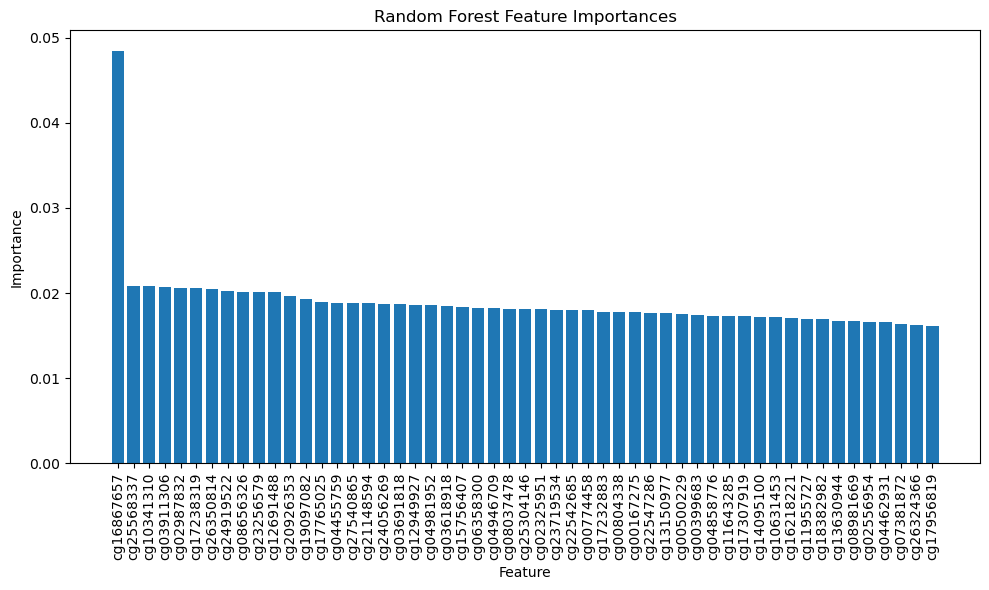

In [17]:
import matplotlib.pyplot as plt

# Assuming the above code for training the model and extracting feature importances

# Sort feature importances in descending order
indices = feature_importances.argsort()[::-1]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(X.shape[1]), feature_importances[indices], align="center")
plt.xticks(range(X.shape[1]), pivoted_samples_07.T.columns[indices], rotation=90)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Random Forest Feature Importances")
plt.tight_layout()
plt.show()

#### all

In [18]:
pivoted_samples_40279.T.shape

(656, 473034)

In [19]:
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
import pandas as pd

# Assuming pivoted_samples_07, sample_age_gender_data, and filtered_probe_ids_07 are already defined
# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_40279.T

# Impute missing values (NaN) with mean values for Expression
imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
X = imputer.fit_transform(X)

# Assuming sample_age_gender_data_40279 is defined
y = sample_age_gender_data_40279['Age']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Convert the target variable to a numeric type
y_train = y_train.astype('float32')
y_test = y_test.astype('float32')

# Standardize the input features (important for some models)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Random Forest Classifier
clf = RandomForestClassifier(n_estimators=500, random_state=42)

# Fit the classifier to the training data
clf.fit(X_train_scaled, y_train)

# Extract feature importances
feature_importances = clf.feature_importances_

In [22]:
# Create a Series with feature importances and their corresponding column names
feature_scores = pd.Series(feature_importances, index=pivoted_samples_40279.T.columns)

# Sort the Series in descending order
feature_scores_sorted = feature_scores.sort_values(ascending=False)

# Create a DataFrame to store feature importances and corresponding probe IDs
feature_importance_df = pd.DataFrame({'Probe_ID': feature_scores_sorted.index,
                                       'Importance': feature_scores_sorted.values})

In [24]:
feature_importance_df.head()

,Probe_ID,Importance
0,cg16867657,0.000606
1,cg24724428,0.000211
2,cg07553761,0.000165
3,cg15582719,0.000151
4,cg06639320,0.000145


In [23]:
import pickle
# Save the feature_importance_df object to a local file
with open('feature_importance_df.pickle', 'wb') as file:
    pickle.dump(feature_importance_df, file)

In [ ]:
import pickle
with open('feature_importance_df.pickle', 'rb') as file:
    feature_importance_df = pickle.load(file)

In [138]:
# Sort feature importances in descending order
indices = feature_importances.argsort()[::-1]

# Print feature importances
for index in indices:
    feature = pivoted_samples_40279.T.columns[index]
    importance = feature_importances[index]
    print(f"{feature}: {importance}")

cg16867657: 0.0006721485613474593
cg24724428: 0.0003885374630716091
cg15582719: 0.00034814978584018537
cg04456437: 0.0002484748257718972
cg22775123: 0.00024363591546179754
cg03354616: 0.00022279351431521904
cg13907049: 0.000222089037150691
cg08082791: 0.00022179483854274456
cg22572159: 0.0002204532967674585
cg13178372: 0.00022001438859541804
cg21928627: 0.00021428302264854621
cg27089789: 0.00020284946041683254
cg03257916: 0.0002023185056975682
cg02650266: 0.0002016276678551141
cg22161115: 0.00019996287672213535
cg03442226: 0.00019806886045262408
cg02875787: 0.0001958999771746539
cg14032959: 0.00018962025354579443
cg08441170: 0.00018922155318586595
cg26159934: 0.00018802184198157923
cg05469396: 0.00018733590271692997
cg20638583: 0.0001860153601667681
cg16099496: 0.00018496390525667817
cg27289153: 0.00018405637007143206
cg27442478: 0.00018381697860951843
cg00723431: 0.0001834680156538234
cg06005169: 0.0001823790487902867
cg11299207: 0.0001815647228657704
cg12694440: 0.0001812303852819297

In [ ]:
import matplotlib.pyplot as plt

# Assuming the above code for training the model and extracting feature importances

# Sort feature importances in descending order
indices = feature_importances.argsort()[::-1]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(X.shape[1]), feature_importances[indices], align="center")
plt.xticks(range(X.shape[1]), pivoted_samples_40279.T.columns[indices], rotation=90)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Random Forest Feature Importances")
plt.tight_layout()
plt.show()

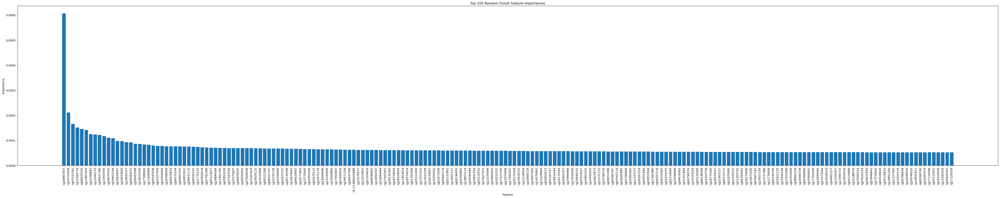

In [26]:
import matplotlib.pyplot as plt

# Assuming the above code for training the model and extracting feature importances

# Sort feature importances in descending order
indices = feature_importances.argsort()[::-1]

# Select the top 200 features
top_indices = indices[:200]
top_features = pivoted_samples_40279.T.columns[top_indices]
top_importances = feature_importances[top_indices]

# Plot the top 200 feature importances
plt.figure(figsize=(50, 10))
plt.bar(range(len(top_features)), top_importances, align="center")
plt.xticks(range(len(top_features)), top_features, rotation=90)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Top 200 Random Forest Feature Importances")
plt.tight_layout()
plt.show()

### MLP

#### MLP  by scikit-learn to predict age

In [115]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer

In [116]:
# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_07.T

# Load the age values for the dataset
y = sample_age_gender_data_40279['Age']

# Split the data into training and testing sets (you can adjust the test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Set hyperparameters
hidden_layer_sizes = (5000, 5000, 1000, 500, 100, 53)
activation = 'relu'
solver = 'adam'
learning_rate = 'constant'
max_iter = 1000
batch_size = 'auto'
alpha = 0.0001
early_stopping = True
random_state = 42

# Create MLPRegressor
mlp_model = MLPRegressor(
    hidden_layer_sizes=hidden_layer_sizes,
    activation=activation,
    solver=solver,
    learning_rate=learning_rate,
    max_iter=max_iter,
    batch_size=batch_size,
    alpha=alpha,
    early_stopping=early_stopping,
    random_state=random_state
)

# Fit the model to the training data
mlp_model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = mlp_model.predict(X_test)

# Calculate evaluation metrics (e.g., Mean Squared Error and R-squared)
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

# Now you can use the trained MLP model to predict age for new data
new_data_to_predict = pivoted_samples_30870
X_new_data_to_predict = new_data_to_predict[new_data_to_predict.index.isin(filtered_probe_ids_07)].T

# Impute missing values (NaN) with mean values for Expression
imputer = SimpleImputer(strategy='mean')
X_new_data_to_predict = imputer.fit_transform(X_new_data_to_predict)

predicted_age_mlp = mlp_model.predict(X_new_data_to_predict)
print(predicted_age_mlp)

# Comparison with Chronological Age
Chronological_age_30870 = gse30870.phenotype_data['characteristics_ch1.0.age']

data_mlp = {
    'Predicted age (MLP)': predicted_age_mlp,
    'Chronological age': Chronological_age_30870
}

predicted_30870_mlp = pd.DataFrame(data_mlp)
print(predicted_30870_mlp)


c:\Users\tokyo\anaconda3\envs\tensorflow_use\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\tokyo\anaconda3\envs\tensorflow_use\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\tokyo\anaconda3\envs\tensorflow_use\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\tokyo\anaconda3\envs\tensorflow_use\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\tokyo\anaconda3\envs\tensorflow_use\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\t

Mean Squared Error: 94.11360375425754
R-squared: 0.594397716176997
[72.52851661 14.30623286 73.78131487 64.60850871 76.14706312 78.90954242
 71.75783371 72.04155981 75.9578631  71.67638468 65.43981611 70.62094468
 77.24489338 69.85461769 86.40099559 70.64215859 74.62111664 77.16814605
 79.94954023 81.28264384 72.14699503 17.59677981 17.53995648 14.21073559
 18.87939917 18.16135253 22.96421906 13.47366454 14.07870263 24.8520017
 19.47534375 19.59582545 20.96378221 18.55194475 14.62465229 18.54770933
 13.94216365 12.46296024 19.14676212 20.50801691]
           Predicted age (MLP) Chronological age
GSM765860            72.528517         103 years
GSM765861            14.306233           Newborn
GSM765862            73.781315          97 years
GSM765863            64.608509          95 years
GSM765864            76.147063          97 years
GSM765865            78.909542          97 years
GSM765866            71.757834          98 years
GSM765867            72.041560          96 years
GSM76

c:\Users\tokyo\anaconda3\envs\tensorflow_use\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\tokyo\anaconda3\envs\tensorflow_use\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


In [60]:
# Remove ' years' from Chronological age and replace 'Newborn' with 1
predicted_30870_mlp['Chronological age'] = predicted_30870_mlp['Chronological age'].str.replace(' years', '').replace('Newborn', '0')

# Convert the Chronological age column to numeric
predicted_30870_mlp['Chronological age'] = pd.to_numeric(predicted_30870_mlp['Chronological age'])

# Print the updated DataFrame
print(predicted_30870_mlp)

           Predicted age (MLP)  Chronological age
GSM765860            72.528517                103
GSM765861            14.306233                  0
GSM765862            73.781315                 97
GSM765863            64.608509                 95
GSM765864            76.147063                 97
GSM765865            78.909542                 97
GSM765866            71.757834                 98
GSM765867            72.041560                 96
GSM765868            75.957863                100
GSM765869            71.676385                 90
GSM765870            65.439816                 91
GSM765871            70.620945                 92
GSM765872            77.244893                 89
GSM765873            69.854618                 90
GSM765874            86.400996                 89
GSM765875            70.642159                 90
GSM765876            74.621117                 91
GSM765877            77.168146                 89
GSM765878            79.949540                 89


In [61]:
# Calculate evaluation metrics (e.g., Mean Squared Error and R-squared)
Chronological = predicted_30870_mlp['Chronological age']
Predicted = predicted_30870_mlp['Predicted age (MLP)']

mse = mean_squared_error(Chronological, Predicted)
r_squared = r2_score(Chronological, Predicted)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

Mean Squared Error: 368.180419221164
R-squared: 0.8309582562012016


#### MLP by tensorflow

In [43]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

##### Construct model and training

In [44]:
# Assuming pivoted_samples_07 and sample_age_gender_data are already defined
# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_07.T

imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
# Impute missing values (NaN) with mean values for Expression
X = imputer.fit_transform(X)

In [59]:
# Load the age values for the dataset
# y = combined_age_data['Age']
y = sample_age_gender_data_40279['Age']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Convert the target variable to a numeric type
y_train = y_train.astype('float32')
y_test = y_test.astype('float32')

# Standardize the input features (important for neural networks)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Sequential model
model = Sequential()

'''
# Add hidden layers to the model
model.add(Dense(units=256, activation='relu', input_dim=X_train_scaled.shape[1]))
model.add(Dense(units=256, activation='relu'))
model.add(Dense(units=256, activation='relu'))
model.add(Dense(units=128, activation='relu'))
model.add(Dense(units=1, activation='linear'))  # Output layer with linear activation for regression
'''
'''
# Add hidden layers to the model with Batch Normalization
model.add(Dense(units=5120, input_dim=X_train_scaled.shape[1]))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=5120))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=2560))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=256))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=1, activation='linear'))  # Output layer with linear activation for regression
''' 
# Add hidden layers to the model with Batch Normalization and L2 regularization
model.add(Dense(units=5120, input_dim=X_train_scaled.shape[1], kernel_regularizer=l2(0.0001)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=5120, kernel_regularizer=l2(0.0001)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=2560, kernel_regularizer=l2(0.0001)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=256, kernel_regularizer=l2(0.0001)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=1, activation='linear', kernel_regularizer=l2(0.0001)))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error')

# Train the model
# model.fit(X_train_scaled, y_train, epochs=500, batch_size=32, validation_data=(X_test_scaled, y_test))

In [ ]:
# Train the model with callbacks
model.fit(
    X_train_scaled, y_train,
    epochs=500,
    batch_size=None,
    validation_data=(X_test_scaled, y_test))

In [111]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Use validation loss as the metric to monitor
    patience=30,          # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True  # Restore model weights from the epoch with the best value of the monitored quantity
)

# Define ReduceLROnPlateau callback for adaptive learning rate
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Use validation loss as the metric to monitor
    factor=0.5,           # Factor by which the learning rate will be reduced (new_lr = lr * factor)
    patience=10,           # Number of epochs with no improvement after which learning rate will be reduced
    min_lr=1e-1          # Lower bound on the learning rate
)

# Train the model with callbacks
model.fit(
    X_train_scaled, y_train,
    epochs=200,
    batch_size=None,
    validation_data=(X_test_scaled, y_test),
    # callbacks=[early_stopping, reduce_lr]  # Use both EarlyStopping and ReduceLROnPlateau
    callbacks=[reduce_lr]
)

Epoch 1/200


19/19 [==============================] - 1s 28ms/step - loss: 4086.8992 - val_loss: 4401.8667 - lr: 1.0000e-04
Epoch 2/200
19/19 [==============================] - 0s 11ms/step - loss: 3951.5615 - val_loss: 4310.5938 - lr: 1.0000e-04
Epoch 3/200
19/19 [==============================] - 0s 11ms/step - loss: 3883.5437 - val_loss: 4284.9688 - lr: 1.0000e-04
Epoch 4/200
19/19 [==============================] - 0s 11ms/step - loss: 3831.0940 - val_loss: 4258.5688 - lr: 1.0000e-04
Epoch 5/200
19/19 [==============================] - 0s 11ms/step - loss: 3785.0110 - val_loss: 4223.2739 - lr: 1.0000e-04
Epoch 6/200
19/19 [==============================] - 0s 11ms/step - loss: 3741.4016 - val_loss: 4175.3555 - lr: 1.0000e-04
Epoch 7/200
19/19 [==============================] - 0s 11ms/step - loss: 3719.3020 - val_loss: 4127.7554 - lr: 1.0000e-04
Epoch 8/200
19/19 [==============================] - 0s 11ms/step - loss: 3689.9712 - val_loss: 4126.7334 - lr: 1.0000e-04
Epoch 9/200
19/19 [=========

##### Check tensorflow is using GPU to train MLP model

In [ ]:
import tensorflow as tf

# List all available devices, including GPUs
print(tf.config.list_physical_devices('GPU'))

In [ ]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

In [ ]:
import tensorflow as tf
tf.test.is_built_with_cuda()

In [ ]:
import tensorflow as tf

# Explicitly set the GPU device
physical_devices = tf.config.list_physical_devices('GPU')
print(physical_devices)
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)


##### Model summary

In [46]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 5120)              276480    
                                                                 
 batch_normalization (BatchN  (None, 5120)             20480     
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 5120)              0         
                                                                 
 dense_1 (Dense)             (None, 5120)              26219520  
                                                                 
 batch_normalization_1 (Batc  (None, 5120)             20480     
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 5120)              0

##### Visualization of gradient descent

Epoch 1/200


19/19 [==============================] - 1s 24ms/step - loss: 4039.9551 - val_loss: 4409.4697 - epoch: 1.0000 - lr: 1.0000e-04
Epoch 2/200
19/19 [==============================] - 0s 12ms/step - loss: 3897.5144 - val_loss: 4290.1069 - epoch: 2.0000 - lr: 1.0000e-04
Epoch 3/200
19/19 [==============================] - 0s 11ms/step - loss: 3819.2573 - val_loss: 4228.7109 - epoch: 3.0000 - lr: 1.0000e-04
Epoch 4/200
19/19 [==============================] - 0s 12ms/step - loss: 3766.4160 - val_loss: 4187.0645 - epoch: 4.0000 - lr: 1.0000e-04
Epoch 5/200
19/19 [==============================] - 0s 11ms/step - loss: 3728.1453 - val_loss: 4173.2368 - epoch: 5.0000 - lr: 1.0000e-04
Epoch 6/200
19/19 [==============================] - 0s 11ms/step - loss: 3692.2529 - val_loss: 4107.5669 - epoch: 6.0000 - lr: 1.0000e-04
Epoch 7/200
19/19 [==============================] - 0s 11ms/step - loss: 3642.7275 - val_loss: 4066.7773 - epoch: 7.0000 - lr: 1.0000e-04
Epoch 8/200
19/19 [====================

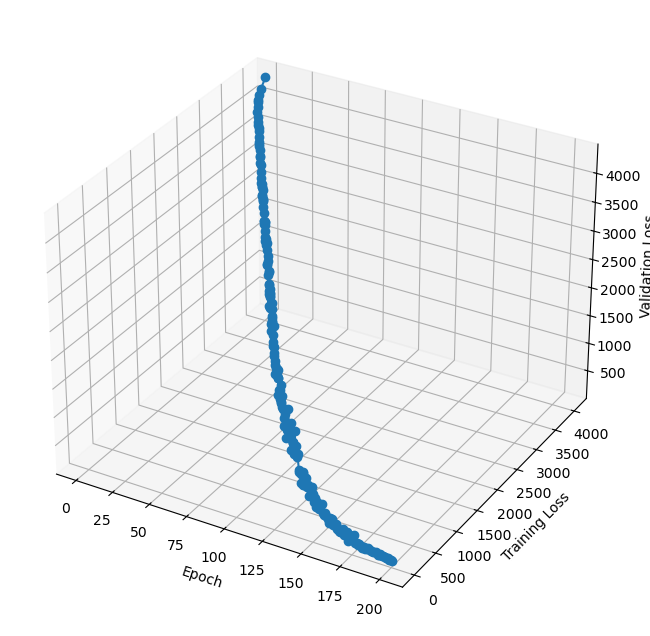

In [52]:
import matplotlib.pyplot as plt
import tensorflow as tf  # Add this line to import TensorFlow
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define EarlyStopping and ReduceLROnPlateau callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=30,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=10,
    min_lr=1e-4
)

# Initialize an empty list to store the training history for plotting
history = []

# Callback to record training history
class CustomCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        logs['epoch'] = epoch + 1  # Add 1 to start epoch count from 1
        history.append(logs.copy())


# Create an instance of the custom callback
custom_callback = CustomCallback()

# Train the model with callbacks, including the custom callback
model.fit(
    X_train_scaled, y_train,
    epochs=200,
    batch_size=None,
    validation_data=(X_test_scaled, y_test),
    callbacks=[custom_callback, reduce_lr]
)

# Extract training history
history_df = pd.DataFrame(history)

# Visualize the 3D plot of the cost function
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.plot(history_df['epoch'], history_df['loss'], history_df['val_loss'], marker='o')

ax.set_xlabel('Epoch')
ax.set_ylabel('Training Loss')
ax.set_zlabel('Validation Loss')

plt.show()


Epoch 1/200
19/19 [==============================] - 1s 29ms/step - loss: 4084.1624 - val_loss: 4445.5718 - lr: 1.0000e-04
Epoch 2/200
19/19 [==============================] - 0s 22ms/step - loss: 3948.0813 - val_loss: 4331.0254 - lr: 1.0000e-04
Epoch 3/200
19/19 [==============================] - 0s 21ms/step - loss: 3873.5823 - val_loss: 4294.2524 - lr: 1.0000e-04
Epoch 4/200
19/19 [==============================] - 0s 22ms/step - loss: 3836.7437 - val_loss: 4289.1392 - lr: 1.0000e-04
Epoch 5/200
19/19 [==============================] - 0s 22ms/step - loss: 3785.7505 - val_loss: 4202.6504 - lr: 1.0000e-04
Epoch 6/200
19/19 [==============================] - 0s 22ms/step - loss: 3747.5725 - val_loss: 4173.7529 - lr: 1.0000e-04
Epoch 7/200
19/19 [==============================] - 0s 22ms/step - loss: 3714.4348 - val_loss: 4111.5811 - lr: 1.0000e-04
Epoch 8/200
19/19 [==============================] - 0s 22ms/step - loss: 3684.4194 - val_loss: 4085.1033 - lr: 1.0000e-04
Epoch 9/200
19/1

IndexError: index 13057 is out of bounds for axis 1 with size 13057

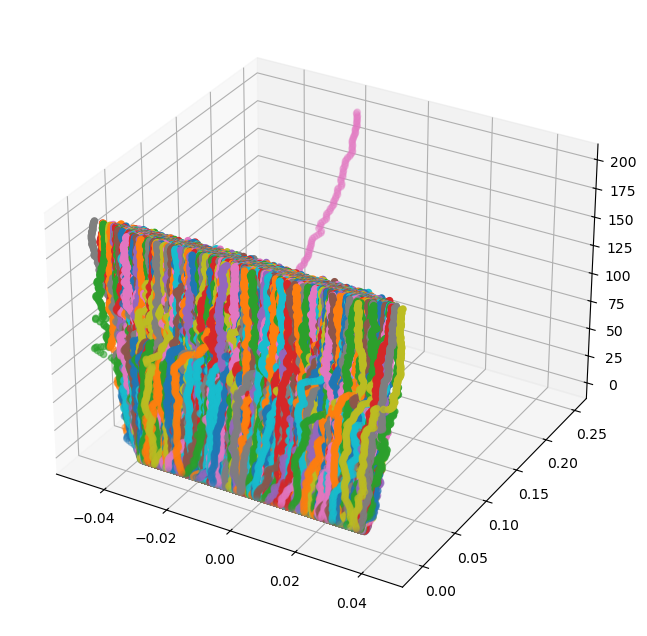

In [54]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=10,
    min_lr=1e-4
)

# Callback to record training history including weights and biases
class CustomCallback(tf.keras.callbacks.Callback):
    def __init__(self, model):
        self.model = model
        self.weights_history = []
        self.biases_history = []

    def on_epoch_end(self, epoch, logs=None):
        # Get weights and biases from each layer
        weights = []
        biases = []
        for layer in self.model.layers:
            if hasattr(layer, 'kernel'):
                weights.append(layer.get_weights()[0].flatten())
            if hasattr(layer, 'bias'):
                biases.append(layer.get_weights()[1])

        # Flatten and append to history
        self.weights_history.append(np.concatenate(weights))
        self.biases_history.append(np.concatenate(biases))

# Create an instance of the custom callback
custom_callback = CustomCallback(model)

# Train the model with callbacks, including the custom callback
model.fit(
    X_train_scaled, y_train,
    epochs=200,
    batch_size=None,
    validation_data=(X_test_scaled, y_test),
    callbacks=[custom_callback, reduce_lr]
)

# Convert weights and biases history to NumPy arrays
weights_array = np.array(custom_callback.weights_history)
biases_array = np.array(custom_callback.biases_history)

# Visualize the 3D plot of weights and biases
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for i in range(weights_array.shape[1]):
    ax.scatter(weights_array[:, i], biases_array[:, i], range(len(weights_array)), marker='o')

ax.set_xlabel('Weights')
ax.set_ylabel('Biases')
ax.set_zlabel('Epoch')

plt.show()


In [60]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import tensorflow as tf

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=10,
    min_lr=1e-4
)
# Callback to record training history including weights and biases
class CustomCallback(tf.keras.callbacks.Callback):
    def __init__(self, model, X, y):
        self.model = model
        self.X = X
        self.y = y
        self.weights_history = []
        self.biases_history = []
        self.loss_history = []

    def on_epoch_end(self, epoch, logs=None):
        # Get weights and biases from each layer
        weights = []
        biases = []
        for layer in self.model.layers:
            if hasattr(layer, 'kernel'):
                weights.append(layer.get_weights()[0].flatten())
            if hasattr(layer, 'bias'):
                biases.append(layer.get_weights()[1])

        # Flatten and append to history
        self.weights_history.append(np.concatenate(weights))
        self.biases_history.append(np.concatenate(biases))

        # Evaluate the model on the entire dataset to get the loss
        loss = self.model.evaluate(self.X, self.y, verbose=0)
        self.loss_history.append(loss)

# Create an instance of the custom callback
custom_callback = CustomCallback(model, X_train_scaled, y_train)

# Train the model with callbacks, including the custom callback
model.fit(
    X_train_scaled, y_train,
    epochs=30,
    batch_size=None,
    validation_data=(X_test_scaled, y_test),
    callbacks=[custom_callback, reduce_lr]
)

# Convert weights, biases, and loss history to NumPy arrays
weights_array = np.array(custom_callback.weights_history)
biases_array = np.array(custom_callback.biases_history)
loss_array = np.array(custom_callback.loss_history)

# Reshape weights and biases arrays
num_epochs = len(weights_array)
num_parameters = len(weights_array[0])

weights_array = weights_array.reshape((num_epochs, -1))
biases_array = biases_array.reshape((num_epochs, -1))

# Create meshgrid for weights and biases
W, B = np.meshgrid(weights_array[0, :], biases_array[0, :])

# Create 3D surface plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
surf = ax.plot_surface(W, B, loss_array.T, cmap='viridis', alpha=0.8)

# Add labels and title
ax.set_xlabel('Weights')
ax.set_ylabel('Biases')
ax.set_zlabel('Loss')
ax.set_title('3D Surface of Cost Function')

# Add color bar
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)

plt.show()

Epoch 1/30
19/19 [==============================] - 1s 33ms/step - loss: 4169.3926 - val_loss: 4449.1641 - lr: 1.0000e-04
Epoch 2/30
19/19 [==============================] - 0s 27ms/step - loss: 4033.9297 - val_loss: 4357.6182 - lr: 1.0000e-04
Epoch 3/30
19/19 [==============================] - 0s 26ms/step - loss: 3960.7598 - val_loss: 4313.1138 - lr: 1.0000e-04
Epoch 4/30
19/19 [==============================] - 0s 26ms/step - loss: 3903.8767 - val_loss: 4272.3408 - lr: 1.0000e-04
Epoch 5/30
19/19 [==============================] - 0s 26ms/step - loss: 3862.4412 - val_loss: 4223.2710 - lr: 1.0000e-04
Epoch 6/30
19/19 [==============================] - 0s 27ms/step - loss: 3832.6836 - val_loss: 4213.7529 - lr: 1.0000e-04
Epoch 7/30
19/19 [==============================] - 0s 26ms/step - loss: 3781.5300 - val_loss: 4187.6587 - lr: 1.0000e-04
Epoch 8/30
19/19 [==============================] - 0s 27ms/step - loss: 3753.2190 - val_loss: 4126.9966 - lr: 1.0000e-04
Epoch 9/30
19/19 [======

MemoryError: Unable to allocate 1.91 TiB for an array with shape (13057, 40248576) and data type float32

Epoch 1/50


3/3 [==============================] - 0s 48ms/step - loss: 5.5126
Epoch 2/50
3/3 [==============================] - 0s 25ms/step - loss: 5.4886
Epoch 3/50
3/3 [==============================] - 0s 29ms/step - loss: 5.4652
Epoch 4/50
3/3 [==============================] - 0s 31ms/step - loss: 5.4421
Epoch 5/50
3/3 [==============================] - 0s 27ms/step - loss: 5.4186
Epoch 6/50
3/3 [==============================] - 0s 29ms/step - loss: 5.3976
Epoch 7/50
3/3 [==============================] - 0s 30ms/step - loss: 5.3742
Epoch 8/50
3/3 [==============================] - 0s 26ms/step - loss: 5.3517
Epoch 9/50
3/3 [==============================] - 0s 28ms/step - loss: 5.3302
Epoch 10/50
3/3 [==============================] - 0s 29ms/step - loss: 5.3067
Epoch 11/50
3/3 [==============================] - 0s 26ms/step - loss: 5.2855
Epoch 12/50
3/3 [==============================] - 0s 24ms/step - loss: 5.2654
Epoch 13/50
3/3 [==============================] - 0s 25ms/step - loss: 

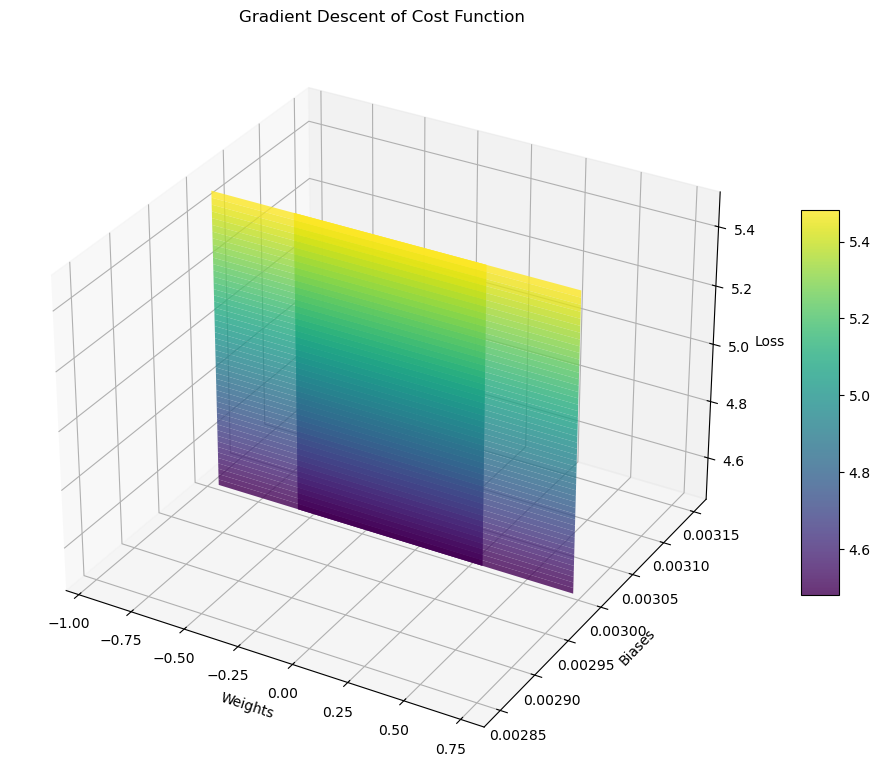

In [62]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generate synthetic data
np.random.seed(42)
X_synthetic = np.random.rand(100, 5)  # 100 samples, 5 features
y_synthetic = 3 * X_synthetic[:, 0] + 2 * X_synthetic[:, 1] - 1.5 * X_synthetic[:, 2] + np.random.normal(0, 0.1, 100)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_synthetic, y_synthetic, test_size=0.2, random_state=42)

# Standardize the input features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a simple MLP model
model = Sequential()
model.add(Dense(units=1, input_dim=X_train_scaled.shape[1], activation='linear'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Callback to record training history including weights and biases
class CustomCallback(tf.keras.callbacks.Callback):
    def __init__(self, model, X, y):
        self.model = model
        self.X = X
        self.y = y
        self.weights_history = []
        self.biases_history = []
        self.loss_history = []

    def on_epoch_end(self, epoch, logs=None):
        # Get weights and biases from the model
        weights = self.model.layers[0].get_weights()[0].flatten()
        biases = self.model.layers[0].get_weights()[1]

        # Append to history
        self.weights_history.append(weights)
        self.biases_history.append(biases)

        # Evaluate the model on the entire dataset to get the loss
        loss = self.model.evaluate(self.X, self.y, verbose=0)
        self.loss_history.append(loss)

# Create an instance of the custom callback
custom_callback = CustomCallback(model, X_train_scaled, y_train)

# Train the model with callbacks, including the custom callback
model.fit(
    X_train_scaled, y_train,
    epochs=50,
    batch_size=None,
    callbacks=[custom_callback]
)

# Convert weights, biases, and loss history to NumPy arrays
weights_array = np.array(custom_callback.weights_history)
biases_array = np.array(custom_callback.biases_history)
loss_array = np.array(custom_callback.loss_history).reshape(-1, 1)  # Reshape to ensure it's a 2D array

# Create meshgrid for weights and biases
W, B = np.meshgrid(weights_array[0, :], biases_array[0, :])

# Create 3D surface plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
surf = ax.plot_surface(W, B, loss_array, cmap='viridis', alpha=0.8)

# Add labels and title
ax.set_xlabel('Weights')
ax.set_ylabel('Biases')
ax.set_zlabel('Loss')
ax.set_title('Gradient Descent of Cost Function')

# Add color bar
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)

plt.show()


In [64]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generate synthetic data
np.random.seed(42)
X = 2 * np.random.rand(100, 2)  # 100 samples, 2 features
y = 3 + 4 * X[:, 0] + 2 * X[:, 1] + np.random.randn(100)

# Define a simple quadratic cost function
def cost_function(X, y, theta):
    m = len(y)
    J = (1 / (2 * m)) * np.sum((X.dot(theta) - y)**2)
    return J

# Create a meshgrid for theta0 and theta1
theta0_vals = np.linspace(-10, 10, 100)
theta1_vals = np.linspace(-10, 10, 100)
theta0, theta1 = np.meshgrid(theta0_vals, theta1_vals)
theta = np.vstack((theta0.ravel(), theta1.ravel()))  # Combine into a 2D array

# Reshape X to include a bias term
X_b = np.c_[np.ones((X.shape[0], 1)), X]

# Calculate the cost for each combination of theta0 and theta1
J_vals = np.array([cost_function(X_b, y, np.array([t0, t1])) for t0, t1 in zip(theta[0], theta[1])])
J_vals = J_vals.reshape(theta0.shape)

# Create 3D surface plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
surf = ax.plot_surface(theta0, theta1, J_vals, cmap='viridis', alpha=0.8)

# Add labels and title
ax.set_xlabel(r'$\theta_0$')
ax.set_ylabel(r'$\theta_1$')
ax.set_zlabel('Cost')
ax.set_title('Cost Function')

# Add color bar
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)

plt.show()


ValueError: shapes (100,3) and (2,) not aligned: 3 (dim 1) != 2 (dim 0)

##### MSE and R-squared for y_pred and y_test on X_scaled

In [112]:
# Make predictions on the test data
y_pred = model.predict(X_test_scaled)

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

3/3 [==============================] - 0s 31ms/step
Mean Squared Error: 83.897125
R-squared: 0.6384277713046642


In [ ]:
print(y_pred)

In [ ]:
data = pivoted_samples_30870.T
data

##### Predict on additional dataset 

###### Impute missing value by KNN

In [113]:
from sklearn.impute import SimpleImputer, KNNImputer

# Now you can use the trained model to predict age for new data
new_data_to_predict = pivoted_samples_30870
X_new_data_to_predict = new_data_to_predict[new_data_to_predict.index.isin(filtered_probe_ids_07)].T

# Standardize the input features (important for neural networks)
scaler = StandardScaler()
imputer = KNNImputer(n_neighbors=3, weights='uniform', metric='nan_euclidean')
# Impute missing values (NaN) with mean values for Expression
X_new_data_to_predict = imputer.fit_transform(X_new_data_to_predict)
# X_new_data_KNNimputed_to_predict = imputer.transform(X_new_data_to_predict)

# Standardize the new data using the same scaler
X_new_data_to_predict_KNNimputed_scaled = scaler.fit_transform(X_new_data_to_predict)

# Make predictions on the new data (Imputed and standardized)
predicted_KNN = model.predict(X_new_data_to_predict_KNNimputed_scaled)

# Print the predicted ages
print(predicted_KNN)

2/2 [==============================] - 0s 3ms/step
[[58.71065 ]
 [36.90186 ]
 [75.27126 ]
 [74.67395 ]
 [85.25271 ]
 [73.05638 ]
 [83.06683 ]
 [70.120255]
 [67.53893 ]
 [78.44141 ]
 [81.92844 ]
 [82.158356]
 [82.716446]
 [73.367004]
 [85.21932 ]
 [74.65971 ]
 [58.437214]
 [56.06734 ]
 [75.215004]
 [78.546906]
 [71.80734 ]
 [47.860847]
 [45.76589 ]
 [34.63145 ]
 [48.992123]
 [39.253483]
 [51.794827]
 [38.127728]
 [44.061497]
 [53.510937]
 [55.914406]
 [45.41984 ]
 [49.237484]
 [49.106483]
 [39.08356 ]
 [52.185616]
 [46.506916]
 [31.484545]
 [53.09699 ]
 [51.657818]]


In [114]:
import numpy as np
import pandas as pd

# Flatten the predicted_age_mlp_tensorflow array
predicted_age_flattened = predicted_KNN.flatten()

# Comparison with Chronological Age
Chronological_age_30870 = gse30870.phenotype_data['characteristics_ch1.0.age']

# Create the DataFrame
data_mlp_tensorflow = {
    'Predicted age (MLP)': predicted_age_flattened,
    'Chronological age': Chronological_age_30870
}

predicted_30870_mlp_KNN = pd.DataFrame(data_mlp_tensorflow)
print(predicted_30870_mlp_KNN)

           Predicted age (MLP) Chronological age
GSM765860            58.710651         103 years
GSM765861            36.901859           Newborn
GSM765862            75.271263          97 years
GSM765863            74.673950          95 years
GSM765864            85.252708          97 years
GSM765865            73.056381          97 years
GSM765866            83.066833          98 years
GSM765867            70.120255          96 years
GSM765868            67.538933         100 years
GSM765869            78.441406          90 years
GSM765870            81.928436          91 years
GSM765871            82.158356          92 years
GSM765872            82.716446          89 years
GSM765873            73.367004          90 years
GSM765874            85.219322          89 years
GSM765875            74.659714          90 years
GSM765876            58.437214          91 years
GSM765877            56.067341          89 years
GSM765878            75.215004          89 years
GSM765879           

In [ ]:
# Remove ' years' from Chronological age and replace 'Newborn' with 1
predicted_30870_mlp_KNN['Chronological age'] = predicted_30870_mlp_KNN['Chronological age'].str.replace(' years', '').replace('Newborn', '0')

# Convert the Chronological age column to numeric
predicted_30870_mlp_KNN['Chronological age'] = pd.to_numeric(predicted_30870_mlp_KNN['Chronological age'])

# Print the updated DataFrame
print(predicted_30870_mlp_KNN)

In [ ]:
# Calculate evaluation metrics (e.g., Mean Squared Error and R-squared)
Chronological = predicted_30870_mlp_KNN['Chronological age']
Predicted = predicted_30870_mlp_KNN['Predicted age (MLP)']

mse = mean_squared_error(Chronological, Predicted)
r_squared = r2_score(Chronological, Predicted)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

###### Impute missing values by mean

In [ ]:
# Now you can use the trained model to predict age for new data
new_data_to_predict = pivoted_samples_30870
X_new_data_to_predict = new_data_to_predict[new_data_to_predict.index.isin(filtered_probe_ids_07)].T

imputer = SimpleImputer(strategy='mean')
# Impute missing values (NaN) with mean values for Expression
X_new_data_to_predict = imputer.fit_transform(X_new_data_to_predict)

# Standardize the new data using the same scaler
X_new_data_to_predict_scaled = scaler.fit_transform(X_new_data_to_predict)

# Make predictions on the new data
predicted_mean = model.predict(X_new_data_to_predict_scaled)

# Print the predicted ages
print(predicted_mean)

In [ ]:
import numpy as np
import pandas as pd

# Flatten the predicted_age_mlp_tensorflow array
predicted_age_flattened = predicted_mean.flatten()

# Comparison with Chronological Age
Chronological_age_30870 = gse30870.phenotype_data['characteristics_ch1.0.age']

# Create the DataFrame
data_mlp_mean_tensorflow = {
    'Predicted age (MLP)': predicted_age_flattened,
    'Chronological age': Chronological_age_30870
}

predicted_30870_mlp_mean = pd.DataFrame(data_mlp_mean_tensorflow)
print(predicted_30870_mlp_mean)

In [ ]:
# Remove ' years' from Chronological age and replace 'Newborn' with 1
predicted_30870_mlp_mean['Chronological age'] = predicted_30870_mlp_mean['Chronological age'].str.replace(' years', '').replace('Newborn', '0')

# Convert the Chronological age column to numeric
predicted_30870_mlp_mean['Chronological age'] = pd.to_numeric(predicted_30870_mlp_mean['Chronological age'])

# Print the updated DataFrame
print(predicted_30870_mlp_mean)

In [ ]:
# Calculate evaluation metrics (e.g., Mean Squared Error and R-squared)
Chronological = predicted_30870_mlp_mean['Chronological age']
Predicted = predicted_30870_mlp_mean['Predicted age (MLP)']

mse = mean_squared_error(Chronological, Predicted)
r_squared = r2_score(Chronological, Predicted)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

#### CNN by tensorflow

In [ ]:
import numpy as np
import pandas as pd
import tensorflow
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

In [ ]:
# Assuming pivoted_samples_07 and sample_age_gender_data are already defined
# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_07.T

imputer = KNNImputer(n_neighbors=3, weights='uniform', metric='nan_euclidean')
# Impute missing values (NaN) with mean values for Expression
X = imputer.fit_transform(X)

In [ ]:
X

In [ ]:
# Reshape data for Conv1D (assuming each row corresponds to a sample)
# X = X.values.reshape(X.shape[0], X.shape[1], 1)
# X = X.reshape(X.shape[0], X.shape[1], 1)

In [ ]:
X

In [ ]:
# Load the age values for the dataset and convert to numeric
# y = pd.to_numeric(sample_age_gender_data_40279['Age'], errors='coerce')

y = combined_age_data['Age']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

y_train = y_train.astype('float32')
y_test = y_test.astype('float32')


# Standardize the input features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.reshape(X_train.shape[0], X_train.shape[1]))
X_test_scaled = scaler.fit_transform(X_test.reshape(X_test.shape[0], X_test.shape[1]))

# Create a Sequential model
model = Sequential()

# Add Conv1D layer
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_scaled.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Dense(units=256, activation='relu'))
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_scaled.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Dense(units=256, activation='relu'))
model.add(Flatten())

# Add dense layers
model.add(Dense(units=256, activation='relu'))
model.add(Dense(units=256, activation='relu'))
model.add(Dense(units=128, activation='relu'))
model.add(Dense(units=128, activation='relu'))
model.add(Dense(units=1, activation='linear'))  # Output layer with linear activation for regression

'''
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
'''
# Compile the model with an initial learning rate
initial_learning_rate = 0.001
optimizer = Adam(learning_rate=initial_learning_rate)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
# model.fit(X_train_scaled, y_train, epochs=500, batch_size=32, validation_data=(X_test_scaled, y_test))

In [ ]:
# Load the age values for the dataset and convert to numeric
y = pd.to_numeric(sample_age_gender_data_40279['Age'], errors='coerce')

# y = combined_age_data['Age']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

y_train = y_train.astype('float32')
y_test = y_test.astype('float32')


# Standardize the input features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.reshape(X_train.shape[0], X_train.shape[1]))
X_test_scaled = scaler.fit_transform(X_test.reshape(X_test.shape[0], X_test.shape[1]))

# Create a Sequential model
model = Sequential()

# Add Conv1D layer with Batch Normalization
model.add(Conv1D(filters=32, kernel_size=2, input_shape=(X_train_scaled.shape[1], 1)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling1D(pool_size=2))

# Add another Conv1D layer with Batch Normalization
model.add(Conv1D(filters=32, kernel_size=2))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling1D(pool_size=2))
'''
# Add another Conv1D layer with Batch Normalization
model.add(Conv1D(filters=64, kernel_size=3))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling1D(pool_size=2))
'''

# Flatten before fully connected layers
model.add(Flatten())

# Add dense layers with Batch Normalization
model.add(Dense(units=256))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=256))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=256))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(units=1, activation='linear'))  # Output layer with linear activation for regression

# Compile the model with an initial learning rate
initial_learning_rate = 0.001
optimizer = Adam(learning_rate=initial_learning_rate)
model.compile(optimizer=optimizer, loss='mean_squared_error')


##### Advance way of adaptive learning rate

In [ ]:
# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='loss',  # Use validation loss as the metric to monitor
    patience=30,          # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True  # Restore model weights from the epoch with the best value of the monitored quantity
)

# Define ReduceLROnPlateau callback for adaptive learning rate
reduce_lr = ReduceLROnPlateau(
    monitor='loss',  # Use validation loss as the metric to monitor
    factor=0.5,           # Factor by which the learning rate will be reduced (new_lr = lr * factor)
    patience=5,           # Number of epochs with no improvement after which learning rate will be reduced
    min_lr=1e-7           # Lower bound on the learning rate
)

'''
# Train the model with callbacks
trained_model = model.fit(
    X_train_scaled, y_train,
    epochs=1000,
    batch_size=32,
    validation_data=(X_test_scaled, y_test),
    callbacks=[early_stopping, reduce_lr]  # Use both EarlyStopping and ReduceLROnPlateau
)
'''
model.fit(
    X_train_scaled, y_train,
    epochs=1000,
    batch_size=64,
    validation_data=(X_test_scaled, y_test),
    callbacks=[early_stopping, reduce_lr]  # Use both EarlyStopping and ReduceLROnPlateau
)

##### Simple way of adaptive learning rate

In [ ]:
# Train the model
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.callbacks import EarlyStopping

# Define a simple learning rate schedule
def lr_schedule(epoch):
    return 0.001 * 0.9 ** epoch  # Adjust the function as needed

# Create a LearningRateScheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule)
# Define EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# During model.fit(), add the lr_scheduler callback
model.fit(X_train_scaled, y_train, epochs=200, batch_size=32, validation_data=(X_test_scaled, y_test), callbacks=[lr_scheduler, early_stopping])


In [ ]:
# Print the summary of the model
model.summary()

In [ ]:
# Get the input shape from the first layer
input_shape = model.layers[0].input_shape[1:]

# Print the input shape
print("Input shape:", input_shape)

In [ ]:
# Make predictions on the test data
y_pred = model.predict(X_test_scaled)

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

In [ ]:
# Now you can use the trained model to predict age for new data
new_data_to_predict = pivoted_samples_50660
X_new_data_to_predict = new_data_to_predict[new_data_to_predict.index.isin(filtered_probe_ids_07)].T

# Impute missing values (NaN) with mean values for Expression
imputer = SimpleImputer(strategy='mean')

# Impute missing values (NaN) with mean values for Expression
X_new_data_to_predict = imputer.fit_transform(X_new_data_to_predict)

# Standardize the new data using the same scaler
X_new_data_to_predict_scaled = scaler.transform(X_new_data_to_predict)

# Reshape data for CNN input
# X_new_data_to_predict_reshaped = X_new_data_to_predict_scaled.reshape((X_new_data_to_predict_scaled.shape[0], X_new_data_to_predict_scaled.shape[1], 1))

# Make predictions on the new data
predicted_age_cnn_tensorflow = model.predict(X_new_data_to_predict_scaled)

# Print the predicted ages
print(predicted_age_cnn_tensorflow)

In [ ]:
import numpy as np
import pandas as pd

# Flatten the predicted_age_mlp_tensorflow array
predicted_age_flattened = predicted_age_cnn_tensorflow.flatten()

# Comparison with Chronological Age
Chronological_age_50660 = sample_age_data_50660['Age']

# Create the DataFrame
data_cnn_tensorflow = {
    'Predicted age (CNN)': predicted_age_flattened,
    'Chronological age': Chronological_age_50660
}

predicted_50660_cnn_tensorflow = pd.DataFrame(data_cnn_tensorflow)
print(predicted_50660_cnn_tensorflow)

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming predicted_50660_cnn_tensorflow is a DataFrame
predicted_50660_cnn_tensorflow = predicted_50660_cnn_tensorflow.sort_values(by='Chronological age', ascending=True)

x_coordinate = predicted_50660_cnn_tensorflow['Chronological age']
y_coordinate = predicted_50660_cnn_tensorflow['Predicted age (CNN)']
plt.scatter(x_coordinate, y_coordinate)

plt.title(f"Scatter plot for gse50660")
plt.xlabel('Chronological age')
plt.ylabel('Predicted age (CNN)')

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
# Calculate evaluation metrics (e.g., Mean Squared Error and R-squared)
Chronological = predicted_50660_cnn_tensorflow['Chronological age']
Predicted = predicted_50660_cnn_tensorflow['Predicted age (CNN)']

mse = mean_squared_error(Chronological, Predicted)
r_squared = r2_score(Chronological, Predicted)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

In [ ]:
# Now you can use the trained model to predict age for new data
new_data_to_predict = pivoted_samples_50660
X_new_data_to_predict = new_data_to_predict[new_data_to_predict.index.isin(filtered_probe_ids_07)].T

# Impute missing values (NaN) with mean values for Expression
imputer = SimpleImputer(strategy='mean')

# Impute missing values (NaN) with mean values for Expression
X_new_data_to_predict = imputer.fit_transform(X_new_data_to_predict)

# Standardize the new data using the same scaler
X_new_data_to_predict_scaled = scaler.transform(X_new_data_to_predict)

# Reshape data for CNN input
# X_new_data_to_predict_reshaped = X_new_data_to_predict_scaled.reshape((X_new_data_to_predict_scaled.shape[0], X_new_data_to_predict_scaled.shape[1], 1))

# Make predictions on the new data
predicted_30870_age_cnn_tensorflow = model.predict(X_new_data_to_predict_scaled)

# Print the predicted ages
print(predicted_30870_age_cnn_tensorflow)

In [ ]:
import numpy as np
import pandas as pd

# Flatten the predicted_age_mlp_tensorflow array
predicted_30870_age_flattened = predicted_30870_age_cnn_tensorflow.flatten()

# Comparison with Chronological Age
Chronological_age_30870 = gse30870.phenotype_data['characteristics_ch1.0.age']

# Create the DataFrame
data_30870_cnn_tensorflow = {
    'Predicted age (CNN)': predicted_30870_age_flattened,
    'Chronological age': Chronological_age_30870
}

predicted_30870_cnn_tensorflow = pd.DataFrame(data_30870_cnn_tensorflow)
print(predicted_30870_cnn_tensorflow)

In [ ]:
# Remove ' years' from Chronological age and replace 'Newborn' with 1
predicted_30870_cnn_tensorflow['Chronological age'] = predicted_30870_cnn_tensorflow['Chronological age'].str.replace(' years', '').replace('Newborn', '0')

# Convert the Chronological age column to numeric
predicted_30870_cnn_tensorflow['Chronological age'] = pd.to_numeric(predicted_30870_cnn_tensorflow['Chronological age'])

# Print the updated DataFrame
print(predicted_30870_cnn_tensorflow)

In [ ]:
# Calculate evaluation metrics (e.g., Mean Squared Error and R-squared)
Chronological = predicted_30870_cnn_tensorflow['Chronological age']
Predicted = predicted_30870_cnn_tensorflow['Predicted age (CNN)']

mse = mean_squared_error(Chronological, Predicted)
r_squared = r2_score(Chronological, Predicted)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

### Transformer by tensorflow

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, MultiHeadAttention, Embedding, LayerNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Assuming pivoted_samples_07 and sample_age_gender_data are already defined

# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_07.T

# Load the age values for the dataset
y = sample_age_gender_data_40279['Age']

# Convert the target variable to a numeric type
y = y.astype('float32')

# Reshape data for Transformer (assuming each row corresponds to a sample)
X = X.values.reshape(X.shape[0], X.shape[1], 1)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the input features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.reshape(X_train.shape[0], X_train.shape[1]))
X_test_scaled = scaler.transform(X_test.reshape(X_test.shape[0], X_test.shape[1]))

def transformer_model(input_shape):
    inputs = Input(shape=input_shape)
    x = Embedding(input_dim=max(input_shape[1], 54), output_dim=64)(inputs)  # Adjusted input_dim
    x = MultiHeadAttention(num_heads=8, key_dim=64)(x, x)
    x = LayerNormalization(epsilon=1e-6)(x)
    x = Dense(units=256, activation='relu')(x)
    x = Dense(units=256, activation='relu')(x)
    x = Dense(units=53, activation='relu')(x)
    x = Dense(units=1, activation='linear')(x)
    model = Model(inputs=inputs, outputs=x)
    return model

# Create Transformer model
model = transformer_model((X_train_scaled.shape[1], 1))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=500, batch_size=32, validation_data=(X_test_scaled, y_test))

# Now you can use the trained model to predict age for new data
new_data_to_predict = pivoted_samples_30870
X_new_data_to_predict = new_data_to_predict[new_data_to_predict.index.isin(filtered_probe_ids_07)].T

# Impute missing values (NaN) with mean values for Expression
X_new_data_to_predict = imputer.transform(X_new_data_to_predict)

# Reshape and standardize the new data
X_new_data_to_predict_scaled = scaler.transform(X_new_data_to_predict)

# Make predictions on the new data
predicted_age = model.predict(X_new_data_to_predict_scaled)


In [ ]:
# Print the predicted age
print(predicted_age)

#### Fix

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, MultiHeadAttention, Embedding, LayerNormalization, Flatten
from tensorflow.keras.optimizers import Adam

# Assuming pivoted_samples_07 and sample_age_gender_data are already defined

# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_07.T

# Load the age values for the dataset
y = sample_age_gender_data_40279['Age']

# Convert the target variable to a numeric type
y = y.astype('float32')

# Reshape data for Transformer (assuming each row corresponds to a sample)
X = X.values.reshape(X.shape[0], X.shape[1], 1)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the input features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.reshape(X_train.shape[0], X_train.shape[1]))
X_test_scaled = scaler.transform(X_test.reshape(X_test.shape[0], X_test.shape[1]))

def transformer_model(input_shape):
    inputs = Input(shape=input_shape)
    x = Embedding(input_dim=max(input_shape[1], 54), output_dim=64)(inputs)  # Adjusted input_dim
    x = MultiHeadAttention(num_heads=30, key_dim=256)(x, x)
    x = LayerNormalization(epsilon=1e-10)(x)
    x = Flatten()(x)  # Added Flatten layer
    #x = Dense(units=256, activation='relu')(x)
    #x = Dense(units=256, activation='relu')(x)
    #x = Dense(units=128, activation='relu')(x)
    #x = Dense(units=53, activation='relu')(x)
    x = Dense(units=1, activation='linear')(x)
    model = Model(inputs=inputs, outputs=x)
    return model

# Create Transformer model
model = transformer_model((X_train_scaled.shape[1], 1))

# Compile the model with an initial learning rate
initial_learning_rate = 0.01
optimizer = Adam(learning_rate=initial_learning_rate)
model.compile(optimizer=optimizer, loss='mean_squared_error')

In [ ]:
# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='loss',  # Use validation loss as the metric to monitor
    patience=100,          # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True  # Restore model weights from the epoch with the best value of the monitored quantity
)

# Define ReduceLROnPlateau callback for adaptive learning rate
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Use validation loss as the metric to monitor
    factor=0.5,           # Factor by which the learning rate will be reduced (new_lr = lr * factor)
    patience=5,           # Number of epochs with no improvement after which learning rate will be reduced
    min_lr=1e-7           # Lower bound on the learning rate
)

'''
# Train the model with callbacks
trained_model = model.fit(
    X_train_scaled, y_train,
    epochs=500,
    batch_size=32,
    validation_data=(X_test_scaled, y_test),
    callbacks=[early_stopping, reduce_lr]  # Use both EarlyStopping and ReduceLROnPlateau
)
'''
# Train the model with callbacks
model.fit(
    X_train_scaled, y_train,
    epochs=500,
    batch_size=64,
    validation_data=(X_test_scaled, y_test),
    callbacks=[early_stopping, reduce_lr]  # Use both EarlyStopping and ReduceLROnPlateau
)

In [ ]:
# Make predictions on the test data
y_pred = model.predict(X_test_scaled)

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

In [ ]:
# Use the trained model to predict age for new data
new_data_to_predict = pivoted_samples_30870
X_new_data_to_predict = new_data_to_predict[new_data_to_predict.index.isin(filtered_probe_ids_07)].T

# Impute missing values (NaN) with mean values for Expression
X_new_data_to_predict = imputer.transform(X_new_data_to_predict)

# Reshape and standardize the new data
X_new_data_to_predict_scaled = scaler.transform(X_new_data_to_predict)

# Make predictions on the new data
predicted_age_transformer = model.predict(X_new_data_to_predict_scaled)

In [ ]:
# Print the predicted age
print(predicted_age_transformer)

In [ ]:
import numpy as np
import pandas as pd

# Flatten the predicted_age_mlp_tensorflow array
predicted_age_flattened = predicted_age_transformer.flatten()

# Comparison with Chronological Age
Chronological_age_30870 = gse30870.phenotype_data['characteristics_ch1.0.age']

# Create the DataFrame
data_transformer_tensorflow = {
    'Predicted age (Transformer)': predicted_age_flattened,
    'Chronological age': Chronological_age_30870
}

predicted_30870_transformer_tensorflow = pd.DataFrame(data_transformer_tensorflow)
print(predicted_30870_transformer_tensorflow)

### Transformer and MLP head model to predict age

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
beta_values_df = pivoted_samples_07.T
age_df = sample_age_gender_data_40279['Age']

# Convert dataframes to NumPy arrays
beta_values = beta_values_df.values
age_labels = age_df.values

In [ ]:
print(beta_values)
print(len(beta_values))

In [ ]:
print(beta_values.shape[0])

In [ ]:
print(age_labels)
print(len(age_labels))

In [ ]:
# Split the data into training and testing sets (you can adjust the split ratio)
from sklearn.model_selection import train_test_split

beta_train, beta_test, age_train, age_test = train_test_split(
    beta_values, age_labels, test_size=0.2, random_state=42
)

In [ ]:
from tensorflow.keras.layers import BatchNormalization, Flatten

class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerEncoder, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

def create_transformer_model(input_shape, embed_dim, num_heads, ff_dim, num_blocks, mlp_units, dropout=0.1, mlp_dropout=0.1):
    inputs = keras.Input(shape=input_shape)
    x = inputs

    # Create multiple TransformerEncoder blocks
    for _ in range(num_blocks):
        x = TransformerEncoder(embed_dim, num_heads, ff_dim, rate=dropout)(x)

    # Flatten the output instead of GlobalAveragePooling1D
    x = Flatten()(x)

    # BatchNormalization for better convergence
    x = BatchNormalization()(x)
    
    # MLP for age prediction
    for dim in mlp_units:
        x = layers.Dense(dim, activation="relu")(x)
        x = layers.Dropout(mlp_dropout)(x)

    age_output = layers.Dense(1, activation="linear")(x)

    return keras.Model(inputs, age_output, name="transformer_age_prediction")


In [ ]:
# Create and compile the Transformer-based age prediction model
embed_dim = 54  # Embedding dimension
num_heads = 4  # Number of attention heads
ff_dim = 656  # Feedforward dimension in the TransformerEncoder
num_blocks = 4  # Number of TransformerEncoder blocks
mlp_units = [128]  # MLP layer sizes
mlp_dropout = 0.4  # MLP dropout rate
dropout = 0.1  # Dropout rate
model = create_transformer_model(
    input_shape=(beta_values.shape[1],),
    embed_dim=embed_dim,
    num_heads=num_heads,
    ff_dim=ff_dim,
    num_blocks=num_blocks,
    mlp_units=mlp_units,
    mlp_dropout=mlp_dropout,
    dropout=dropout,
)

model.compile(
    loss="mean_squared_error",
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    metrics=["mean_squared_error"],
)

# Define a custom data generator
def data_generator(beta_values, age_labels, batch_size=32):
    num_samples = len(beta_values)
    while True:
        indices = np.arange(num_samples)
        np.random.shuffle(indices)
        for start in range(0, num_samples, batch_size):
            batch_indices = indices[start : start + batch_size]
            yield beta_values[batch_indices], age_labels[batch_indices]

# Create the data generators
batch_size = 32
train_data_generator = data_generator(beta_train, age_train, batch_size)
test_data_generator = data_generator(beta_test, age_test, batch_size)

# Train the model
epochs = 10  # Adjust the number of epochs as needed
model.fit(train_data_generator, epochs=epochs, steps_per_epoch=len(beta_train) // batch_size)

# Evaluate the model on the test set
test_loss = model.evaluate(test_data_generator, steps=len(beta_test) // batch_size)
print(f'Test loss: {test_loss}')

# Make age predictions on new data
# Replace 'new_data.csv' with your new data file
#new_data_df = pd.read_csv('new_data.csv', index_col=0)
#new_beta_values = new_data_df.values
#age_predictions = model.predict(new_beta_values)

# age_predictions now contains the predicted ages for the new data
#print(age_predictions)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Assuming beta_values, age_labels are already defined

# Split the data into training and testing sets
beta_train, beta_test, age_train, age_test = train_test_split(
    beta_values, age_labels, test_size=0.2, random_state=42
)

# Standardize the input features
scaler = StandardScaler()
beta_train_scaled = scaler.fit_transform(beta_train)
beta_test_scaled = scaler.transform(beta_test)

# Define the TransformerEncoder layer
class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerEncoder, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = tf.keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

# Define the Transformer-based age prediction model
def create_transformer_model(input_shape, embed_dim, num_heads, ff_dim, num_blocks, mlp_units, dropout=0.1, mlp_dropout=0.1):
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs

    # Create multiple TransformerEncoder blocks
    for _ in range(num_blocks):
        x = TransformerEncoder(embed_dim, num_heads, ff_dim, rate=dropout)(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(mlp_dropout)(x)
    
    # MLP for age prediction
    for dim in mlp_units:
        x = layers.Dense(dim, activation="relu")(x)
        x = layers.Dropout(mlp_dropout)(x)

    age_output = layers.Dense(1, activation="linear")(x)

    return tf.keras.Model(inputs, age_output, name="transformer_age_prediction")

# Create and compile the Transformer-based age prediction model
embed_dim = 54  # Embedding dimension
num_heads = 4  # Number of attention heads
ff_dim = 656  # Feedforward dimension in the TransformerEncoder
num_blocks = 4  # Number of TransformerEncoder blocks
mlp_units = [128]  # MLP layer sizes
mlp_dropout = 0.4  # MLP dropout rate
dropout = 0.1  # Dropout rate
model = create_transformer_model(
    input_shape=(beta_train_scaled.shape[1],),
    embed_dim=embed_dim,
    num_heads=num_heads,
    ff_dim=ff_dim,
    num_blocks=num_blocks,
    mlp_units=mlp_units,
    mlp_dropout=mlp_dropout,
    dropout=dropout,
)

# Compile the model with an initial learning rate
initial_learning_rate = 0.1
optimizer = Adam(learning_rate=initial_learning_rate)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='loss',  # Use training loss as the metric to monitor
    patience=10,          # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True  # Restore model weights from the epoch with the best value of the monitored quantity
)

# Define ReduceLROnPlateau callback for adaptive learning rate
reduce_lr = ReduceLROnPlateau(
    monitor='loss',  # Use training loss as the metric to monitor
    factor=0.5,           # Factor by which the learning rate will be reduced (new_lr = lr * factor)
    patience=5,           # Number of epochs with no improvement after which learning rate will be reduced
    min_lr=1e-7           # Lower bound on the learning rate
)

# Train the model with callbacks
epochs = 50
batch_size = 32
model.fit(
    beta_train_scaled, age_train,
    epochs=epochs,
    batch_size=batch_size,
    callbacks=[early_stopping, reduce_lr],  # Use both EarlyStopping and ReduceLROnPlateau
)

# Evaluate the model on the test set
test_loss = model.evaluate(beta_test_scaled, age_test)
print(f'Test loss: {test_loss}')

# Make age predictions on new data
# Replace 'new_data.csv' with your new data file
# new_data_df = pd.read_csv('new_data.csv', index_col=0)
# new_beta_values = new_data_df.values
# new_beta_values_scaled = scaler.transform(new_beta_values)
# age_predictions = model.predict(new_beta_values_scaled)

# age_predictions now contains the predicted ages for the new data
# print(age_predictions)


In [ ]:
# Define the TransformerEncoder layer
class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerEncoder, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

# Define the Transformer-based age prediction model
def create_transformer_model(input_shape, embed_dim, num_heads, ff_dim, num_blocks, mlp_units, dropout=0.1, mlp_dropout=0.1):
    inputs = keras.Input(shape=input_shape)
    x = inputs

    # Create multiple TransformerEncoder blocks
    for _ in range(num_blocks):
        x = TransformerEncoder(embed_dim, num_heads, ff_dim, rate=dropout)(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(mlp_dropout)(x)
    
    # MLP for age prediction
    for dim in mlp_units:
        x = layers.Dense(dim, activation="relu")(x)
        x = layers.Dropout(mlp_dropout)(x)

    age_output = layers.Dense(1, activation="linear")(x)

    return keras.Model(inputs, age_output, name="transformer_age_prediction")

# Create and compile the Transformer-based age prediction model
embed_dim = 54  # Embedding dimension
num_heads = 4  # Number of attention heads
ff_dim = 656  # Feedforward dimension in the TransformerEncoder
num_blocks = 4  # Number of TransformerEncoder blocks
mlp_units = [128]  # MLP layer sizes
mlp_dropout = 0.4  # MLP dropout rate
dropout = 0.1  # Dropout rate
model = create_transformer_model(
    input_shape=(beta_values.shape[1],),
    embed_dim=embed_dim,
    num_heads=num_heads,
    ff_dim=ff_dim,
    num_blocks=num_blocks,
    mlp_units=mlp_units,
    mlp_dropout=mlp_dropout,
    dropout=dropout,
)

model.compile(
    loss="mean_squared_error",
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    metrics=["mean_squared_error"],
)

# Define a custom data generator
def data_generator(beta_values, age_labels, batch_size=32):
    num_samples = len(beta_values)
    while True:
        indices = np.arange(num_samples)
        np.random.shuffle(indices)
        for start in range(0, num_samples, batch_size):
            batch_indices = indices[start : start + batch_size]
            yield beta_values[batch_indices], age_labels[batch_indices]

# Create the data generators
batch_size = 32
train_data_generator = data_generator(beta_train, age_train, batch_size)
test_data_generator = data_generator(beta_test, age_test, batch_size)

# Train the model
epochs = 10  # Adjust the number of epochs as needed
model.fit(train_data_generator, epochs=epochs, steps_per_epoch=len(beta_train) // batch_size)

# Evaluate the model on the test set
test_loss = model.evaluate(test_data_generator, steps=len(beta_test) // batch_size)
print(f'Test loss: {test_loss}')

# Make age predictions on new data
# Replace 'new_data.csv' with your new data file
#new_data_df = pd.read_csv('new_data.csv', index_col=0)
#new_beta_values = new_data_df.values
#age_predictions = model.predict(new_beta_values)

# age_predictions now contains the predicted ages for the new data
#print(age_predictions)


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
# Define the TransformerEncoder layer
class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerEncoder, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)
    
    def call(self, inputs, training):
        print("Input shape:", inputs.shape)  # Add this line for debugging
        attn_output = self.att(inputs, inputs)
        print("Attention output shape:", attn_output.shape)  # Add this line for debugging
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        print("FFN output shape:", ffn_output.shape)  # Add this line for debugging
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)


# Define the Transformer-based age prediction model
def create_transformer_model(input_shape, embed_dim, num_heads, ff_dim, num_blocks, mlp_units, dropout=0.1, mlp_dropout=0.1):
    inputs = keras.Input(shape=input_shape)
    x = inputs

    # Create multiple TransformerEncoder blocks
    for _ in range(num_blocks):
        x = TransformerEncoder(embed_dim, num_heads, ff_dim, rate=dropout)(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(mlp_dropout)(x)
    
    # MLP for age prediction
    for dim in mlp_units:
        x = layers.Dense(dim, activation="relu")(x)
        x = layers.Dropout(mlp_dropout)(x)

    age_output = layers.Dense(1, activation="linear")(x)

    return keras.Model(inputs, age_output, name="transformer_age_prediction")

# Create and compile the Transformer-based age prediction model
embed_dim = 53  # Embedding dimension
num_heads = 4  # Number of attention heads
ff_dim = 53  # Feedforward dimension in the TransformerEncoder
num_blocks = 4  # Number of TransformerEncoder blocks
mlp_units = [128]  # MLP layer sizes
mlp_dropout = 0.4  # MLP dropout rate
dropout = 0.1  # Dropout rate
model = create_transformer_model(
    input_shape=(beta_train.shape[1],),  # Adjust the input shape to match your data
    embed_dim=embed_dim,
    num_heads=num_heads,
    ff_dim=ff_dim,
    num_blocks=num_blocks,
    mlp_units=mlp_units,
    mlp_dropout=mlp_dropout,
    dropout=dropout,
)

model.compile(
    loss="mean_squared_error",
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    metrics=["mean_squared_error"],
)

# Define a custom data generator
def data_generator(beta_values, age_labels, batch_size=32):
    num_samples = len(beta_values)
    while True:
        indices = np.arange(num_samples)
        np.random.shuffle(indices)
        for start in range(0, num_samples, batch_size):
            batch_indices = indices[start : start + batch_size]
            yield beta_values[batch_indices], age_labels[batch_indices]

# Create the data generators
batch_size = 32
train_data_generator = data_generator(beta_train, age_train, batch_size)
test_data_generator = data_generator(beta_test, age_test, batch_size)

# Train the model
epochs = 10  # Adjust the number of epochs as needed
model.fit(train_data_generator, epochs=epochs, steps_per_epoch=len(beta_train) // batch_size)

# Evaluate the model on the test set
test_loss = model.evaluate(test_data_generator, steps=len(beta_test) // batch_size)
print(f'Test loss: {test_loss}')

# Make age predictions on new data
# Replace 'new_data.csv' with your new data file
#new_data_df = pd.read_csv('new_data.csv', index_col=0)
#new_beta_values = new_data_df.values
#age_predictions = model.predict(new_beta_values)

# age_predictions now contains the predicted ages for the new data
#print(age_predictions)

In [ ]:
def call(self, inputs, training):
    print("Input shape:", inputs.shape)  # Add this line for debugging
    attn_output = self.att(inputs, inputs)
    print("Attention output shape:", attn_output.shape)  # Add this line for debugging
    attn_output = self.dropout1(attn_output, training=training)
    out1 = self.layernorm1(inputs + attn_output)
    ffn_output = self.ffn(out1)
    print("FFN output shape:", ffn_output.shape)  # Add this line for debugging
    ffn_output = self.dropout2(ffn_output, training=training)
    return self.layernorm2(out1 + ffn_output)


In [ ]:
import numpy as np

# Assuming you have loaded your data into beta_values and age_labels
# Check the shape of beta_values
print("Shape of beta_values:", beta_values.shape)

# Check the shape of age_labels
print("Shape of age_labels:", age_labels.shape)

beta_values.shape[1]


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np

# Define the TransformerEncoder layer
class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerEncoder, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

# Define the Transformer-based age prediction model
def create_transformer_model(input_shape, embed_dim, num_heads, ff_dim, num_blocks, mlp_units, dropout=0.1, mlp_dropout=0.1):
    inputs = keras.Input(shape=input_shape)
    x = inputs

    # Create multiple TransformerEncoder blocks
    for _ in range(num_blocks):
        x = TransformerEncoder(embed_dim, num_heads, ff_dim, rate=dropout)(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(mlp_dropout)(x)
    
    # MLP for age prediction
    for dim in mlp_units:
        x = layers.Dense(dim, activation="relu")(x)
        x = layers.Dropout(mlp_dropout)(x)

    age_output = layers.Dense(1, activation="linear")(x)

    return keras.Model(inputs, age_output, name="transformer_age_prediction")

# Example data preparation (replace this with your own data loading)
# Assuming beta_values is a NumPy array with shape (656, 53)
# and age_labels is a NumPy array with shape (656,)

# Create and compile the Transformer-based age prediction model
embed_dim = 53  # Embedding dimension (should match the number of CpG sites)
num_heads = 4  # Number of attention heads
ff_dim = 128  # Feedforward dimension in the TransformerEncoder
num_blocks = 4  # Number of TransformerEncoder blocks
mlp_units = [128]  # MLP layer sizes
mlp_dropout = 0.4  # MLP dropout rate
dropout = 0.1  # Dropout rate

# Split your data into training and testing sets (adjust as needed)
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(beta_values, age_labels, test_size=0.2, random_state=42)

model = create_transformer_model(
    input_shape=(beta_values.shape[0],),
    embed_dim=embed_dim,
    num_heads=num_heads,
    ff_dim=ff_dim,
    num_blocks=num_blocks,
    mlp_units=mlp_units,
    mlp_dropout=mlp_dropout,
    dropout=dropout,
)

model.compile(
    loss="mean_squared_error",
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    metrics=["mean_squared_error"],
)

# Define a custom data generator
def data_generator(features, labels, batch_size=32):
    num_samples = len(features)
    while True:
        indices = np.arange(num_samples)
        np.random.shuffle(indices)
        for start in range(0, num_samples, batch_size):
            batch_indices = indices[start : start + batch_size]
            yield features[batch_indices], labels[batch_indices]

# Create the data generators
batch_size = 32
train_data_generator = data_generator(X_train, y_train, batch_size)
test_data_generator = data_generator(X_test, y_test, batch_size)

# Train the model
epochs = 10  # Adjust the number of epochs as needed
model.fit(train_data_generator, epochs=epochs, steps_per_epoch=len(X_train) // batch_size)

# Evaluate the model on the test set
test_loss = model.evaluate(test_data_generator, steps=len(X_test) // batch_size)
print(f'Test loss: {test_loss}')

# Make age predictions on new data
# Replace 'new_data.csv' with your new data file
# new_data_df = pd.read_csv('new_data.csv', index_col=0)
# new_beta_values = new_data_df.values
# age_predictions = model.predict(new_beta_values)

# age_predictions now contains the predicted ages for the new data
# print(age_predictions)


#### Test

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, MultiHeadAttention, Embedding, LayerNormalization, Flatten, Concatenate
from tensorflow.keras.optimizers import Adam

# Assuming pivoted_samples_07 and sample_age_gender_data are already defined

# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_07.T

# Load the age values for the dataset
y = sample_age_gender_data_40279['Age']

# Convert the target variable to a numeric type
y = y.astype('float32')

# Reshape data for Transformer (assuming each row corresponds to a sample)
X = X.values.reshape(X.shape[0], X.shape[1], 1)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the input features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.reshape(X_train.shape[0], X_train.shape[1]))
X_test_scaled = scaler.transform(X_test.reshape(X_test.shape[0], X_test.shape[1]))

# Define Transformer Encoder model
def transformer_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = Embedding(input_dim=input_shape[1], output_dim=64)(inputs)  # Embedding layer for positional encoding
    x = MultiHeadAttention(num_heads=8, key_dim=64)(x, x)
    x = LayerNormalization(epsilon=1e-6)(x)
    x = Flatten()(x)
    return Model(inputs=inputs, outputs=x)

# Create Transformer Encoder model
transformer_output = transformer_encoder((X_train_scaled.shape[1], 1))(Input(shape=(X_train_scaled.shape[1], 1)))

# Create MLP model
mlp_input = Input(shape=(X_train_scaled.shape[1],))
x = Dense(100, activation='relu')(mlp_input)
x = Dense(50, activation='relu')(x)

# Concatenate Transformer output and MLP output
combined = Concatenate()([transformer_output, x])

# Final regression layer
output = Dense(units=1, activation='linear')(combined)

# Create the combined model
model = Model(inputs=[transformer_encoder.input, mlp_input], outputs=output)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')

# Train the model
model.fit([X_train_scaled, X_train_scaled], y_train, epochs=50, batch_size=32, validation_data=([X_test_scaled, X_test_scaled], y_test))

# Make predictions on the test data
y_pred = model.predict([X_test_scaled, X_test_scaled])

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)

# Now you can use the trained model to predict age for new data
new_data_to_predict = pivoted_samples_30870
X_new_data_to_predict = new_data_to_predict[new_data_to_predict.index.isin(filtered_probe_ids_07)].T

# Impute missing values (NaN) with mean values for Expression
X_new_data_to_predict = imputer.transform(X_new_data_to_predict)

# Reshape and standardize the new data
X_new_data_to_predict_scaled = scaler.transform(X_new_data_to_predict.reshape(1, -1))

# Make predictions on the new data
predicted_age = model.predict([X_new_data_to_predict_scaled, X_new_data_to_predict_scaled])

# Print the predicted age
print(predicted_age)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, MultiHeadAttention, Embedding, LayerNormalization, Flatten, Concatenate
from tensorflow.keras.optimizers import Adam

# Assuming pivoted_samples_07 and sample_age_gender_data are already defined

# Extract the expression values for the probes in filtered_probe_ids_07
X = pivoted_samples_07.T

# Load the age values for the dataset
y = sample_age_gender_data_40279['Age']

# Convert the target variable to a numeric type
y = y.astype('float32')

# Reshape data for Transformer (assuming each row corresponds to a sample)
X = X.values.reshape(X.shape[0], X.shape[1], 1)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the input features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.reshape(X_train.shape[0], X_train.shape[1]))
X_test_scaled = scaler.transform(X_test.reshape(X_test.shape[0], X_test.shape[1]))

# Define Transformer model
def transformer_model(input_shape):
    inputs = Input(shape=input_shape)
    x = Embedding(input_dim=input_shape[1], output_dim=64)(inputs)  # Embedding layer for positional encoding
    x = MultiHeadAttention(num_heads=8, key_dim=64)(x, x)
    x = LayerNormalization(epsilon=1e-6)(x)
    x = Flatten()(x)  # Flatten the output for MLP

    return Model(inputs=inputs, outputs=x)

# Define MLP model
def mlp_model(input_dim):
    inputs = Input(shape=(input_dim,))
    x = Dense(units=100, activation='relu')(inputs)
    x = Dense(units=50, activation='relu')(x)
    outputs = Dense(units=1, activation='linear')(x)  # Output layer with linear activation for regression

    return Model(inputs=inputs, outputs=outputs)

# Combine Transformer and MLP models
transformer_input_shape = (X_train_scaled.shape[1], 1)
transformer_encoder = transformer_model(transformer_input_shape)

mlp_input_dim = transformer_input_shape[0] * transformer_input_shape[1]
mlp = mlp_model(mlp_input_dim)

combined_model_input = Input(shape=transformer_input_shape)
transformer_output = transformer_encoder(combined_model_input)
mlp_output = mlp(transformer_output)

combined_model = Model(inputs=combined_model_input, outputs=mlp_output)

# Compile the combined model
combined_model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')

# Train the combined model
combined_model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_data=(X_test_scaled, y_test))

# Make predictions on the test data
y_pred = combined_model.predict(X_test_scaled)

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r_squared)


### Below is original code 

In [ ]:
#Filtering out unexpressed probes
expression_threshold = pivoted_samples_average.quantile(0.3)
expressed_probes = pivoted_samples_average[pivoted_samples_average >= expression_threshold].index.tolist()
print("number of probes above threshold: ", len(expressed_probes))

In [ ]:
#Redefine expression data using only the expressed probes
exprsdata = gse.pivot_samples("VALUE").loc[expressed_probes]
exprsdata = exprsdata.T
#Deletes additional samples that aren't being analyzed
exprsdata = exprsdata[exprsdata.index.isin(list_samples)]
#Drop any probe columns where expression data is missing or negative
exprsdata.dropna(axis = 1)

In [ ]:
#Quantile normalization of data
rank_mean = exprsdata.stack().groupby(exprsdata.rank(method='first').stack().astype(int)).mean()
exprsdata.rank(method='min').stack().astype(int).map(rank_mean).unstack()

In [ ]:
#Compute PCA
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(exprsdata)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])

In [ ]:
#Making Dataframe of samples to concatenate with principal components
samplesDf = pd.DataFrame.from_dict(all_samples, orient = 'index', columns = ['type'])
samplesDf.reset_index(inplace=True)

In [ ]:
#Concatenate sample data with PCA data
principalDf = pd.concat([samplesDf, principalDf], axis=1)
principalDf

In [ ]:
#PCA scatter plot
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize = (12,12))
ax = fig.gca(projection='3d')
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_zlabel('Principal Component 3', fontsize = 15)
ax.set_title('3 Component PCA', fontsize = 20)

types = ('control', 'treated')
colors = ['green', 'violet']
for type, color in zip(types, colors):
    indicesToKeep = principalDf['type'] == type
    ax.scatter(principalDf.loc[indicesToKeep, 'principal component 1'],
               principalDf.loc[indicesToKeep, 'principal component 2'], principalDf.loc[indicesToKeep, 'principal component 3'], c = color, s = 50)
ax.legend(types)

In [ ]:
#Calculate variance ratio
pca.explained_variance_ratio_

In [ ]:
#Transpose data matrix for sorting, index correlated to probe IDs
exprsdata = exprsdata.T
exprsdata

In [ ]:
#Sort expression matrix using 800 genes with greatest variance
variances = np.var(exprsdata, axis=1)
srt_idx = variances.argsort()[::-1]
data_sub = exprsdata.iloc[srt_idx].iloc[:800]
data_sub.index = data_sub.index.map(str)
data_sub

In [ ]:
#Extract probe ids from data
probeids = list(data_sub.index)
probeids

In [ ]:
#Upload annotation file as dictionary
dict1 = {}
with open('../data/probe2gene.txt') as f:
    for line in f:
        line = line.strip()
        (platform, probe, symbol) = line.split()
        dict1[probe] = symbol

In [ ]:
#Examine how many ids are duplicates for gene symbols/unmatched
len(set(probeids) - dict1.keys())

In [ ]:
#Reset index and replace with gene symbols, view as dataframe
exprsdata = pd.DataFrame(exprsdata)
exprsdata['symbol'] = exprsdata.index.to_series().map(dict1)
exprsdata.reset_index(inplace=True)
data = exprsdata.set_index('symbol')
#Drop probe id column
data = data.drop('ID_REF', axis=1)
data

In [ ]:
#Drop rows that aren't associated with a particular gene symbol
data = data.reset_index().dropna().set_index('symbol')
data

In [ ]:
#Standardized data to a text file
data_file = ('../expression_matrix_top800_genes.txt')
data.to_csv(data_file, sep='\t')
data_file

In [ ]:
#Import required packages for characteristic direction and utilize warning statements
import warnings
from scipy.stats import chi2
from scipy.stats.mstats import zscore
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

In [ ]:
#Make sample classes, ensure that there is a distinction between control/treated samples
data_cd = {}

sample_classes = {}
sample_class = np.zeros(data.shape[1], dtype=np.int32)
sample_class[samplesDf['type'].values == 'control'] = 1
sample_class[samplesDf['type'].values == 'treated'] = 2
sample_classes = sample_class

print(sample_classes)

In [ ]:
#CD results
cd_res = chdir(data.values, sample_classes, data.index, gamma=.5, sort=False, calculate_sig=False)
cd_coefs = np.array(list(map(lambda x: x[0], cd_res)))

srt_idx = np.abs(cd_coefs).argsort()[::-1]
cd_coefs = cd_coefs[srt_idx][:600]
sorted_DEGs = data.index[srt_idx][:600]
up_genes = dict(zip(sorted_DEGs[cd_coefs > 0], cd_coefs[cd_coefs > 0]))
dn_genes = dict(zip(sorted_DEGs[cd_coefs < 0], cd_coefs[cd_coefs < 0]))
data_cd['up'] = up_genes
data_cd['dn'] = dn_genes

In [ ]:
#Retrieve up and down gene sets
up_list = list(up_genes.keys())
dn_list = list(dn_genes.keys())

In [ ]:
import json
import requests

ENRICHR_URL = 'https://amp.pharm.mssm.edu/Enrichr'

def _enrichr_add_list(genes, meta=''):
    genes_str = '\n'.join(genes)
    payload = {
        'list': (None, genes_str),
        'description': (None, meta)
    }
    # POST genes to the /addList endpoint
    response = requests.post("%s/addList" % ENRICHR_URL, files=payload)
    list_ids = json.loads(response.text)
    return list_ids

def enrichr_link(genes, meta=''):
    list_ids = _enrichr_add_list(genes, meta)
    shortId = list_ids['shortId']
    link = '%s/enrich?dataset=%s' % (ENRICHR_URL, shortId)
    return link

In [ ]:
#Print Enrichr links for further analysis
for key, d in data_cd.items():
    time.sleep(1)
    genes = list(data_cd[key].keys())
    genes = [str(g) for g in genes]
    link = enrichr_link(genes, key)
    print(key)
    print(link)